# FINAL PROJECT : Video Game Market Intelligence & Recommendation System

## 🎮 1. Global Project's Objectives

### 🎯 Objectives 1 : Understand  key factors of a video game success
    Influence Analysis :
- Sales
- Ratings
- Long Term Popularity
- Best-performing Genres
- Impact on Platforms (PlayStation/Xbox/PC)
- Hype vs IRL Reception

### 🎯 Objective 2 : Build a predictive model of success
    Predict :
- Global Sales
- or Metacritic Score (Critical Rating)
###
    In terms of :
- Genre
- Platform
- Developers
- Time Elapsed since Release
- Game Caracteristics
- Users Reviews
- Trends

### 🎯 Objective 3 : Detect Market Tendancies
    Analyze : 
- Growing Genre
- Most Dominant Platforms
- Most Consistent Studios
- Perfomance Drivers by Region


## 🧩 2. Possible Data Sources

#### ✔️ Option 1 : API Steam (Steam Web API + SteamSpy API)
#### ✔️ Option 2 : API RAWG (Best for video games)
#### ✔️ Option 3 : Kaggle Datasets

    I chose Option 2 because it is the most complete data source for game infos, and because we can't combine Option 1 and Option 2 since the SteamApps endpoint and the IStoreService endpoint are deleted or unavailable at the moment

### RAWG API

There is more than 800,000 games in RAWG Database, with 40 games per page.<br>
So fetching data to my limit of 18,889 requests on the api key will give me more 720,000 games in my dataset.<br>
But the problem is that I also need 1 request for fetching detailed infos for each games after that, so I will explode my request limit too soon.<br><br>

    Let's go for an optimized strategy :
- 500 request for game list --> 20,000 games with basic info
- 18,319 requests for details --> 18,319 games with complete detailed data
- Total : 18,819 requests

##### Version 3 (Optimized Strategy to fetch as much games as possible within the request limit)

In [1]:
# Libraries importation

import requests
import pandas as pd
import time
import os
from tqdm import tqdm

In [ ]:
RAWG_BASE_URL = "https://api.rawg.io/api"
RAWG_API_KEY = "api_key_here"

SAVE_LIST_PATH = "rawg_games_list.csv"
SAVE_DETAILS_PATH = "rawg_games_details.csv"


# ==============================================================
# 1️⃣ Complete retrieval of the game list (API pagination)
# ==============================================================

def fetch_rawg_games_list_limited(max_list_requests=500):

    # ------------------------------------------------------------------------
    # Fetch up to max_list_requests pages of RAWG games (40 games per request)
    # ------------------------------------------------------------------------
    games = []
    url = f"{RAWG_BASE_URL}/games"
    params = {"key": RAWG_API_KEY, "page_size": 40}
    page_count = 0
    
    # -----------------------------------------------
    # Calculate total games we can fetch for the list
    # -----------------------------------------------
    max_games = max_list_requests * 40
    print(f"Fetching up to {max_list_requests} list requests ({max_games} games max)...")

    while url and page_count < max_list_requests:
        page_count += 1
        try:
            # -----------------------------------
            # If it's the first page, pass params
            # -----------------------------------
            if "page=" not in url:
                response = requests.get(url, params=params, timeout=15)
            else:
                response = requests.get(url, timeout=15)  # next URL already complete
            response.raise_for_status()
            data = response.json()

            games.extend(data["results"])

            # ----------------------------------------
            # Check if we've reached the request limit
            # ----------------------------------------
            if page_count >= max_list_requests:
                print(f"🚀 List request limit reached: {max_list_requests} pages fetched ({len(games)} games).")
                print(f"📌 Page to resume later: {page_count + 1}")
                break

            url = data.get("next")
            print(f"✅ Page {page_count}/{max_list_requests} fetched, total games: {len(games)}")
            time.sleep(0.25)

        except Exception as e:
            print(f"⚠️ Error on page {page_count}, retry in 5 sec: {e}")
            time.sleep(5)
            continue

    df = pd.DataFrame(games)
    df.to_csv(SAVE_LIST_PATH, index=False)
    print(f"📁 Partial list saved: {SAVE_LIST_PATH} ({len(df)} games)")

    return df


def fetch_rawg_games_list_limited_continuation(start_page=501, max_additional_pages=439):
    """
    Continue fetching RAWG games list from a specific page.
    Designed to expand beyond the original 20k games with full deduplication.
    """

    # ------------------------------------------------------
    # Load existing list and create ID set for deduplication
    # ------------------------------------------------------
    if os.path.exists(SAVE_LIST_PATH):
        df_existing = pd.read_csv(SAVE_LIST_PATH)
        existing_games = df_existing.to_dict('records')
        existing_game_ids = set(df_existing['id'].tolist())  # Create ID set for fast lookup
        print(f"📄 Loading existing list: {len(existing_games):,} games")
        print(f"🔒 Existing game IDs loaded for deduplication: {len(existing_game_ids):,}")
    else:
        existing_games = []
        existing_game_ids = set()
    
    games = existing_games.copy()  # Start with existing games
    url = f"{RAWG_BASE_URL}/games"
    params = {"key": RAWG_API_KEY, "page_size": 40, "page": start_page}
    page_count = 0
    new_games_added = 0
    duplicates_found = 0
    
    print(f"🔄 Continuing from page {start_page}, fetching {max_additional_pages} additional pages...")
    print(f"🎯 Target: {max_additional_pages * 40:,} new games (duplicates will be skipped)")

    while page_count < max_additional_pages:
        page_count += 1
        current_page = start_page + page_count - 1
        
        try:
            params["page"] = current_page
            response = requests.get(url, params=params, timeout=15)
            response.raise_for_status()
            data = response.json()

            if not data.get("results"):
                print(f"📭 No more games available at page {current_page}")
                break
            
            # --------------------------------------------
            # Check each game for duplicates before adding
            # --------------------------------------------
            for game in data["results"]:
                game_id = game.get("id")
                if game_id not in existing_game_ids:
                    games.append(game)
                    existing_game_ids.add(game_id)  # Add to set to prevent future duplicates
                    new_games_added += 1
                else:
                    duplicates_found += 1
            
            print(f"✅ Page {current_page}: +{len([g for g in data['results'] if g.get('id') not in existing_game_ids])} new, {len([g for g in data['results'] if g.get('id') in existing_game_ids])} duplicates")
            print(f"📊 Total: {len(games):,} games ({new_games_added} new, {duplicates_found} duplicates skipped)")
            
            # ----------------------------
            # Save progress every 50 pages
            # ----------------------------
            if page_count % 50 == 0:
                df_temp = pd.DataFrame(games)
                df_temp.to_csv(SAVE_LIST_PATH, index=False)
                print(f"💾 Progress saved: {len(games):,} games")
            
            time.sleep(0.25)

        except Exception as e:
            print(f"⚠️ Error on page {current_page}, retry in 5 sec: {e}")
            time.sleep(5)
            continue

    # ----------------------------
    # Final save
    # ----------------------------
    df_final = pd.DataFrame(games)
    df_final.to_csv(SAVE_LIST_PATH, index=False)
    print(f"📁 Expanded list saved: {SAVE_LIST_PATH} ({len(df_final):,} total games)")
    print(f"🆕 Added {new_games_added:,} new games")
    print(f"🔄 Skipped {duplicates_found:,} duplicate games")
    print(f"✅ 100% deduplication guaranteed!")

    return df_final


# =============================================================
# 2️⃣ Retrieval of game details
# =============================================================

def fetch_rawg_game_details(game_id, max_retries=3):
    """Fetch game details with retry logic for network errors."""
    params = {"key": RAWG_API_KEY}
    
    for attempt in range(max_retries):
        try:
            response = requests.get(
                f"{RAWG_BASE_URL}/games/{game_id}",
                params=params,
                timeout=15
            )
            response.raise_for_status()
            data = response.json()
            
            # --------------------------------
            # Validate that we got valid data
            # --------------------------------
            if data is None or not isinstance(data, dict):
                print(f"⚠️ Invalid data received for game {game_id}")
                return None, True  # True = API request was consumed
                
            return data, True  # True = API request was consumed
            
        except (requests.exceptions.ConnectionError, 
                requests.exceptions.Timeout, 
                requests.exceptions.HTTPError) as e:
            
            # ------------------------------------------------------------------
            # These are network-level errors - retry without consuming API quota
            # ------------------------------------------------------------------
            if attempt < max_retries - 1:
                wait_time = 2 ** attempt  # Exponential backoff: 1s, 2s, 4s
                print(f"⚠️ Network error for game {game_id} (attempt {attempt + 1}/{max_retries}): {e}")
                print(f"🔄 Retrying in {wait_time} seconds...")
                time.sleep(wait_time)
                continue
            else:
                print(f"❌ Failed to fetch game {game_id} after {max_retries} attempts: {e}")
                return None, False  # False = API request was NOT consumed
                
        except Exception as e:

            # -----------------------------------------------------------------------
            # Other errors (like JSON decode errors) - these consumed the API request
            # -----------------------------------------------------------------------
            print(f"⚠️ Error processing game {game_id}: {e}")
            return None, True  # True = API request was consumed


# =============================================================
# 3️⃣ Cleaning fields from RAWG details
# =============================================================

def extract_clean_fields_rawg(details):
    # Add extra validation
    if details is None or not isinstance(details, dict):
        return None

    try:
        genres = ", ".join([g["name"] for g in details.get("genres", []) if isinstance(g, dict) and "name" in g])
        platforms = ", ".join([p["platform"]["name"] for p in details.get("platforms", []) if isinstance(p, dict) and isinstance(p.get("platform"), dict) and "name" in p["platform"]])
        developers = ", ".join([d["name"] for d in details.get("developers", []) if isinstance(d, dict) and "name" in d])
        publishers = ", ".join([p["name"] for p in details.get("publishers", []) if isinstance(p, dict) and "name" in p])
        tags = ", ".join([t["name"] for t in details.get("tags", []) if isinstance(t, dict) and "name" in t])
        
        # --------------------------------
        # Safe extraction of ESRB rating
        # --------------------------------
        esrb_rating = details.get("esrb_rating")
        esrb = esrb_rating.get("name") if isinstance(esrb_rating, dict) else None

        return {
            "rawg_id": details.get("id"),
            "name": details.get("name"),
            "released": details.get("released"),

            "metacritic_score": details.get("metacritic"),
            "user_rating": details.get("rating"),
            "ratings_count": details.get("ratings_count"),
            "playtime_avg_hours": details.get("playtime"),

            "genres": genres,
            "platforms": platforms,
            "developers": developers,
            "publishers": publishers,
            "tags": tags,
            "suggestions_count": details.get("suggestions_count"),
            "esrb_rating": esrb,
        }
    except Exception as e:
        print(f"⚠️ Error extracting fields from game data: {e}")
        return None


# =======================================================================
# 4️⃣ Complete Pipeline (with progressive saving and 18,819 requests limit)
# =======================================================================

def fetch_rawg_details_limited(total_api_limit=18799, list_requests=500):
    """Fetch detailed data optimizing API usage within total limit."""

    # ------------------------------------------------------------
    # Calculate how many requests we can use for details
    # ------------------------------------------------------------
    max_detail_requests = total_api_limit - list_requests
    print(f"📊 API Budget: {total_api_limit} total ({list_requests} for list, {max_detail_requests} for details)")
    
    # -----------------------------------
    # Load game list (if already exists)
    # -----------------------------------
    if os.path.exists(SAVE_LIST_PATH):
        df_list = pd.read_csv(SAVE_LIST_PATH)
        print(f"📄 RAWG list loaded from: {SAVE_LIST_PATH} ({len(df_list)} games)")

        # ------------------------------------------------------------------------
        # Since list already exists, we can use all remaining requests for details
        # ------------------------------------------------------------------------
        max_detail_requests = total_api_limit
        print(f"🔄 List already exists - using all {max_detail_requests} requests for details")
    else:
        df_list = fetch_rawg_games_list_limited(list_requests)
        print(f"📥 Used {list_requests} requests for game list")

    cleaned_data = []
    processed_count = 0
    api_requests_used = 0
    resume_index = 0
    existing_ids = set()

    # ------------------------------------------------------------
    # If a partial file exists → load it to avoid duplication
    # ------------------------------------------------------------
    if os.path.exists(SAVE_DETAILS_PATH):
        df_existing = pd.read_csv(SAVE_DETAILS_PATH)
        existing_ids = set(df_existing["rawg_id"].tolist())
        processed_count = len(df_existing)
        cleaned_data = df_existing.to_dict('records')

        # --------------------------------
        # Find where to resume
        # --------------------------------
        if processed_count > 0:
            last_id = df_existing["rawg_id"].iloc[-1]
            resume_index = df_list[df_list["id"] == last_id].index[0] + 1 if not df_list[df_list["id"] == last_id].empty else 0
        print(f"♻️ Partial extraction found: {processed_count} games already processed")
        print(f"🔒 Deduplication set loaded: {len(existing_ids):,} game IDs to skip")
        print(f"📍 Resuming from game index: {resume_index}")
    else:
        existing_ids = set()
        print(f"🆕 Starting fresh - no existing details found")

    # -------------------------------------------------------------------
    # Additional safety check: verify no duplicate IDs in the list itself
    # -------------------------------------------------------------------
    list_ids = df_list['id'].tolist()
    unique_list_ids = set(list_ids)
    if len(list_ids) != len(unique_list_ids):
        print(f"⚠️ Warning: Found {len(list_ids) - len(unique_list_ids)} duplicate IDs in game list")
        df_list = df_list.drop_duplicates(subset=['id'], keep='first')
        print(f"🔧 Cleaned list: {len(df_list)} unique games")

    # -----------------------------------------
    # Process games starting from resume_index
    # -----------------------------------------
    games_to_process = df_list.iloc[resume_index:].reset_index(drop=True)
    print(f"🎯 Processing {len(games_to_process):,} games (skipping {len(existing_ids):,} already detailed)")
    
    for i, (_, row) in enumerate(tqdm(games_to_process.iterrows(), total=len(games_to_process))):
        game_id = row["id"]
        
        # --------------------------------------------
        # Double-check deduplication (critical safety)
        # --------------------------------------------
        if game_id in existing_ids:
            print(f"🔄 Skipping game {game_id} - already processed")
            continue

        # -------------------------------------------------------
        # Stop if we've reached the API request limit for details
        # -------------------------------------------------------
        if api_requests_used >= max_detail_requests:
            current_index = resume_index + i
            print(f"🚀 API request limit reached: {max_detail_requests} detail requests used")
            print(f"📊 Total games processed: {processed_count}")
            print(f"📌 Resume from game index: {current_index} (Game ID: {game_id})")
            print(f"💡 To resume: update list_requests to 0 and start from this index")
            break

        details, api_consumed = fetch_rawg_game_details(game_id)
        
        # -----------------------------------------------------------
        # Only increment API counter if request was actually consumed
        # -----------------------------------------------------------
        if api_consumed:
            api_requests_used += 1
        # ---------------------------------
        # Only process if we got valid data
        # ---------------------------------
        if details is not None:
            cleaned = extract_clean_fields_rawg(details)
            
            if cleaned:
                cleaned_data.append(cleaned)
                processed_count += 1
                existing_ids.add(game_id)  # Add to existing_ids to avoid duplicates
        elif not api_consumed:

            # --------------------------------------------------------------------
            # Network error that didn't consume API quota - we can try again later
            # --------------------------------------------------------------------
            print(f"⚠️ Skipping game {game_id} due to network error (API request NOT consumed)")
        else:
            # ------------------------------------------
            # API request consumed but data was invalid
            # ------------------------------------------
            print(f"⚠️ Skipping game {game_id} - invalid data received (API request consumed)")

        # -------------------------------------------
        # Save every 100 iterations and show progress
        # -------------------------------------------
        if processed_count % 100 == 0 and processed_count > 0:
            pd.DataFrame(cleaned_data).to_csv(SAVE_DETAILS_PATH, index=False)
            print(f"💾 Progress saved: {processed_count} games processed, {api_requests_used} detail requests used")

        time.sleep(0.2)
    
    # -------------------------------------------
    # Final save with deduplication verification
    # -------------------------------------------
    df_final = pd.DataFrame(cleaned_data)
    
    # -------------------------------------------
    # Final deduplication check
    # -------------------------------------------
    initial_count = len(df_final)
    df_final = df_final.drop_duplicates(subset=['rawg_id'], keep='first')
    final_count = len(df_final)
    
    if initial_count != final_count:
        print(f"⚠️ Removed {initial_count - final_count} duplicate entries in final save")
    
    df_final.to_csv(SAVE_DETAILS_PATH, index=False)
    print(f"📁 Extraction saved: {SAVE_DETAILS_PATH}")
    print(f"🎮 Total RAWG games with details: {len(df_final)}")
    print(f"✅ Guaranteed unique games: {len(df_final['rawg_id'].unique())} unique IDs")
    print(f"📊 Detail API requests used: {api_requests_used}/{max_detail_requests}")
    print(f"📊 Estimated total API usage: {list_requests + api_requests_used}/{total_api_limit}")

    return df_final


# ==============================================================
# Keep the original function for backward compatibility
# ==============================================================

def fetch_rawg_details_all():
    """Original function - fetches all games without limit."""
    return fetch_rawg_details_limited(total_api_limit=float('inf'))


# ==============================================================
# 5️⃣ Main
# ==============================================================

def verify_no_duplicates():

    # ------------------------------------------------------------
    # Pre-flight check to verify current dataset has no duplicates
    # ------------------------------------------------------------
    print("🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...")
    
    if os.path.exists(SAVE_LIST_PATH):
        df_list = pd.read_csv(SAVE_LIST_PATH)
        list_duplicates = df_list.duplicated(subset=['id']).sum()
        print(f"📋 Game list: {len(df_list):,} games, {list_duplicates} duplicates")
        
        if list_duplicates > 0:
            df_list = df_list.drop_duplicates(subset=['id'], keep='first')
            df_list.to_csv(SAVE_LIST_PATH, index=False)
            print(f"🔧 Cleaned game list: {len(df_list):,} unique games")
    
    if os.path.exists(SAVE_DETAILS_PATH):
        df_details = pd.read_csv(SAVE_DETAILS_PATH)
        detail_duplicates = df_details.duplicated(subset=['rawg_id']).sum()
        print(f"🔍 Game details: {len(df_details):,} games, {detail_duplicates} duplicates")
        
        if detail_duplicates > 0:
            df_details = df_details.drop_duplicates(subset=['rawg_id'], keep='first')
            df_details.to_csv(SAVE_DETAILS_PATH, index=False)
            print(f"🔧 Cleaned game details: {len(df_details):,} unique games")
    
    print("✅ Dataset integrity verified!")


def main():
    """
    OPTIMIZED STRATEGY: Maximize dataset with 18,117 remaining API requests
    
    Phase 1: Complete current 20k list (85 requests)
    Phase 2: Expand list to 37,560 games (439 requests) 
    Phase 3: Get details for all new games (17,560 requests)
    Total: 18,084 requests = 37,560 fully detailed games
    """
    # ----------------------------------------------------
    # Pre-flight check
    # ----------------------------------------------------
    verify_no_duplicates()
    

    # =====================================================
    # Phase 1: Complete current list (85 remaining games)
    # =====================================================

    print("\n🎯 PHASE 1: Completing current 20k game list...")
    df_phase1 = fetch_rawg_details_limited(total_api_limit=85, list_requests=0)
    

    # =====================================================
    # Phase 2: Expand game list from 20k to ~37.6k games 
    # =====================================================
 
    print("\n🚀 PHASE 2: Expanding game list to 37,560 games...")

    # ----------------------------------------------------
    # Continue from where we left off (page 501+)
    # ----------------------------------------------------
    df_expanded_list = fetch_rawg_games_list_limited_continuation(
        start_page=501,  # Continue after original 500 pages
        max_additional_pages=439  # 439 pages × 40 games = 17,560 new games
    )
    

    # =====================================================
    # Phase 3: Get details for all new games
    # =====================================================

    print("\n🎖️ PHASE 3: Fetching details for 17,560 new games...")
    df_final = fetch_rawg_details_limited(
        total_api_limit=17560,  # Details for new games
        list_requests=0  # No new list requests needed
    )
    
    print(f"\n🏆 OPTIMIZATION COMPLETE!")
    print(f"📊 Final dataset: {len(df_final):,} games with complete details")
    print(df_final.head())


if __name__ == "__main__":
    main()

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

💾 Progress saved: 27300 games processed, 7385 detail requests used


 43%|████▎     | 7485/17476 [1:03:52<1:23:29,  1.99it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

💾 Progress saved: 27300 games processed, 7385 detail requests used


 43%|████▎     | 7485/17476 [1:03:52<1:23:29,  1.99it/s]

💾 Progress saved: 27400 games processed, 7485 detail requests used


 43%|████▎     | 7585/17476 [1:04:43<1:12:38,  2.27it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

💾 Progress saved: 27300 games processed, 7385 detail requests used


 43%|████▎     | 7485/17476 [1:03:52<1:23:29,  1.99it/s]

💾 Progress saved: 27400 games processed, 7485 detail requests used


 43%|████▎     | 7585/17476 [1:04:43<1:12:38,  2.27it/s]

💾 Progress saved: 27500 games processed, 7585 detail requests used


 44%|████▍     | 7685/17476 [1:05:36<1:20:20,  2.03it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

💾 Progress saved: 27300 games processed, 7385 detail requests used


 43%|████▎     | 7485/17476 [1:03:52<1:23:29,  1.99it/s]

💾 Progress saved: 27400 games processed, 7485 detail requests used


 43%|████▎     | 7585/17476 [1:04:43<1:12:38,  2.27it/s]

💾 Progress saved: 27500 games processed, 7585 detail requests used


 44%|████▍     | 7685/17476 [1:05:36<1:20:20,  2.03it/s]

💾 Progress saved: 27600 games processed, 7685 detail requests used


 45%|████▍     | 7785/17476 [1:06:33<1:12:34,  2.23it/s]

🔍 PRE-FLIGHT CHECK: Verifying dataset integrity...
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📋 Game list: 20,000 games, 0 duplicates
🔍 Game details: 19,915 games, 0 duplicates
✅ Dataset integrity verified!

🎯 PHASE 1: Completing current 20k game list...
📊 API Budget: 85 total (0 for list, 85 for details)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 19,915 game IDs to skip
📍 Resuming from game index: 20000
🎯 Processing 0 games (skipping 19,915 already detailed)
📄 RAWG list loaded from: rawg_games_list.csv (20000 games)
🔄 List already exists - using all 85 requests for details
♻️ Partial extraction found: 19915 games already processed
🔒 Deduplication set loaded: 1

0it [00:00, ?it/s]



📁 Extraction saved: rawg_games_details.csv
🎮 Total RAWG games with details: 19915
✅ Guaranteed unique games: 19915 unique IDs
📊 Detail API requests used: 0/85
📊 Estimated total API usage: 0/85

🚀 PHASE 2: Expanding game list to 37,560 games...
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
📄 Loading existing list: 20,000 games
🔒 Existing game IDs loaded for deduplication: 20,000
🔄 Continuing from page 501, fetching 439 additional pages...
🎯 Target: 17,560 new games (duplicates will be skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 501: +0 new, 40 duplicates
📊 Total: 20,036 games (36 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates skipped)
✅ Page 502: +0 new, 40 duplicates
📊 Total: 20,076 games (76 new, 4 duplicates s

  0%|          | 84/17476 [00:40<2:04:16,  2.33it/s]

💾 Progress saved: 20000 games processed, 85 detail requests used


  1%|          | 184/17476 [01:26<2:14:41,  2.14it/s]

💾 Progress saved: 20100 games processed, 185 detail requests used


  2%|▏         | 284/17476 [02:13<2:04:52,  2.29it/s]

💾 Progress saved: 20200 games processed, 285 detail requests used


  2%|▏         | 384/17476 [03:01<2:07:34,  2.23it/s]

💾 Progress saved: 20300 games processed, 385 detail requests used


  3%|▎         | 484/17476 [03:51<2:04:59,  2.27it/s]

💾 Progress saved: 20400 games processed, 485 detail requests used


  3%|▎         | 584/17476 [04:36<2:09:56,  2.17it/s]

💾 Progress saved: 20500 games processed, 585 detail requests used


  4%|▍         | 684/17476 [05:25<2:09:30,  2.16it/s]

💾 Progress saved: 20600 games processed, 685 detail requests used


  4%|▍         | 784/17476 [06:14<2:12:46,  2.10it/s]

💾 Progress saved: 20700 games processed, 785 detail requests used


  5%|▌         | 884/17476 [07:00<2:07:40,  2.17it/s]

💾 Progress saved: 20800 games processed, 885 detail requests used


  6%|▌         | 984/17476 [07:48<1:59:03,  2.31it/s]

💾 Progress saved: 20900 games processed, 985 detail requests used


  6%|▌         | 1084/17476 [08:37<2:04:30,  2.19it/s]

💾 Progress saved: 21000 games processed, 1085 detail requests used


  7%|▋         | 1184/17476 [09:23<1:59:04,  2.28it/s]

💾 Progress saved: 21100 games processed, 1185 detail requests used


  7%|▋         | 1284/17476 [10:17<4:35:53,  1.02s/it]

💾 Progress saved: 21200 games processed, 1285 detail requests used


  8%|▊         | 1384/17476 [11:06<2:02:38,  2.19it/s]

💾 Progress saved: 21300 games processed, 1385 detail requests used


  8%|▊         | 1484/17476 [11:57<2:00:31,  2.21it/s]

💾 Progress saved: 21400 games processed, 1485 detail requests used


  9%|▉         | 1584/17476 [12:45<1:50:22,  2.40it/s]

💾 Progress saved: 21500 games processed, 1585 detail requests used


 10%|▉         | 1684/17476 [13:32<2:17:11,  1.92it/s]

💾 Progress saved: 21600 games processed, 1685 detail requests used


 10%|█         | 1784/17476 [14:24<2:05:54,  2.08it/s]

💾 Progress saved: 21700 games processed, 1785 detail requests used


 11%|█         | 1884/17476 [15:19<1:59:31,  2.17it/s]

💾 Progress saved: 21800 games processed, 1885 detail requests used


 11%|█▏        | 1984/17476 [16:15<3:22:44,  1.27it/s]

💾 Progress saved: 21900 games processed, 1985 detail requests used


 12%|█▏        | 2084/17476 [17:05<2:10:41,  1.96it/s]

💾 Progress saved: 22000 games processed, 2085 detail requests used


 12%|█▏        | 2184/17476 [17:59<2:05:07,  2.04it/s]

💾 Progress saved: 22100 games processed, 2185 detail requests used


 13%|█▎        | 2284/17476 [18:49<1:57:09,  2.16it/s]

💾 Progress saved: 22200 games processed, 2285 detail requests used


 14%|█▎        | 2384/17476 [19:40<2:14:07,  1.88it/s]

💾 Progress saved: 22300 games processed, 2385 detail requests used


 14%|█▎        | 2388/17476 [19:42<2:05:33,  2.00it/s]

⚠️ Network error for game 695844 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/695844?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2389/17476 [19:43<3:24:45,  1.23it/s]

⚠️ Network error for game 694456 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/694456?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 14%|█▎        | 2391/17476 [19:45<3:35:50,  1.16it/s]

⚠️ Network error for game 677184 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 677184 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network error (API request NOT consumed)
❌ Failed to fetch game 677184 after 3 attempts: 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/677184?key=252a0707c21a4a15871461fa44ce97b8
⚠️ Skipping game 677184 due to network err

 14%|█▎        | 2393/17476 [19:49<5:30:21,  1.31s/it]

⚠️ Network error for game 667673 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...
⚠️ Network error for game 667673 (attempt 2/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/667673?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 2 seconds...


 14%|█▍        | 2485/17476 [20:39<1:46:24,  2.35it/s] 

💾 Progress saved: 22400 games processed, 2485 detail requests used


 15%|█▍        | 2585/17476 [21:26<1:50:32,  2.25it/s]

💾 Progress saved: 22500 games processed, 2585 detail requests used


 15%|█▌        | 2685/17476 [22:16<1:52:25,  2.19it/s]

💾 Progress saved: 22600 games processed, 2685 detail requests used


 16%|█▌        | 2785/17476 [23:01<1:54:23,  2.14it/s]

💾 Progress saved: 22700 games processed, 2785 detail requests used


 16%|█▋        | 2844/17476 [23:31<2:58:01,  1.37it/s]

⚠️ Network error for game 651121 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/651121?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2845/17476 [23:33<4:01:53,  1.01it/s]

⚠️ Network error for game 649057 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/649057?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 16%|█▋        | 2850/17476 [23:36<2:27:47,  1.65it/s]

⚠️ Network error for game 554727 (attempt 1/3): 502 Server Error: Bad Gateway for url: https://api.rawg.io/api/games/554727?key=252a0707c21a4a15871461fa44ce97b8
🔄 Retrying in 1 seconds...


 17%|█▋        | 2885/17476 [23:54<1:46:00,  2.29it/s]

💾 Progress saved: 22800 games processed, 2885 detail requests used


 17%|█▋        | 2985/17476 [24:41<1:48:00,  2.24it/s]

💾 Progress saved: 22900 games processed, 2985 detail requests used


 18%|█▊        | 3085/17476 [25:27<1:54:56,  2.09it/s]

💾 Progress saved: 23000 games processed, 3085 detail requests used


 18%|█▊        | 3185/17476 [26:14<2:41:28,  1.48it/s]

💾 Progress saved: 23100 games processed, 3185 detail requests used


 19%|█▉        | 3285/17476 [27:02<1:51:31,  2.12it/s]

💾 Progress saved: 23200 games processed, 3285 detail requests used


 19%|█▉        | 3385/17476 [27:48<1:50:10,  2.13it/s]

💾 Progress saved: 23300 games processed, 3385 detail requests used


 20%|█▉        | 3485/17476 [28:38<1:44:57,  2.22it/s]

💾 Progress saved: 23400 games processed, 3485 detail requests used


 21%|██        | 3585/17476 [29:34<1:50:35,  2.09it/s]

💾 Progress saved: 23500 games processed, 3585 detail requests used


 21%|██        | 3685/17476 [30:23<1:41:23,  2.27it/s]

💾 Progress saved: 23600 games processed, 3685 detail requests used


 22%|██▏       | 3785/17476 [31:15<1:39:09,  2.30it/s]

💾 Progress saved: 23700 games processed, 3785 detail requests used


 22%|██▏       | 3885/17476 [32:08<1:40:19,  2.26it/s]

💾 Progress saved: 23800 games processed, 3885 detail requests used


 23%|██▎       | 3985/17476 [33:07<2:52:42,  1.30it/s]

💾 Progress saved: 23900 games processed, 3985 detail requests used


 23%|██▎       | 4085/17476 [33:55<1:37:55,  2.28it/s]

💾 Progress saved: 24000 games processed, 4085 detail requests used


 24%|██▍       | 4185/17476 [34:48<1:54:14,  1.94it/s]

💾 Progress saved: 24100 games processed, 4185 detail requests used


 25%|██▍       | 4285/17476 [35:40<2:03:47,  1.78it/s]

💾 Progress saved: 24200 games processed, 4285 detail requests used


 25%|██▌       | 4385/17476 [36:32<1:38:59,  2.20it/s]

💾 Progress saved: 24300 games processed, 4385 detail requests used


 26%|██▌       | 4485/17476 [37:17<1:38:00,  2.21it/s]

💾 Progress saved: 24400 games processed, 4485 detail requests used


 26%|██▌       | 4585/17476 [38:13<1:35:08,  2.26it/s]

💾 Progress saved: 24500 games processed, 4585 detail requests used


 27%|██▋       | 4685/17476 [39:01<1:28:12,  2.42it/s]

💾 Progress saved: 24600 games processed, 4685 detail requests used


 27%|██▋       | 4785/17476 [39:56<1:55:00,  1.84it/s]

💾 Progress saved: 24700 games processed, 4785 detail requests used


 28%|██▊       | 4885/17476 [40:47<1:35:07,  2.21it/s]

💾 Progress saved: 24800 games processed, 4885 detail requests used


 29%|██▊       | 4985/17476 [41:39<2:22:12,  1.46it/s]

💾 Progress saved: 24900 games processed, 4985 detail requests used


 29%|██▉       | 5085/17476 [42:28<1:38:40,  2.09it/s]

💾 Progress saved: 25000 games processed, 5085 detail requests used


 30%|██▉       | 5185/17476 [43:21<1:31:39,  2.23it/s]

💾 Progress saved: 25100 games processed, 5185 detail requests used


 30%|███       | 5285/17476 [44:12<1:27:48,  2.31it/s]

💾 Progress saved: 25200 games processed, 5285 detail requests used


 31%|███       | 5385/17476 [45:09<1:33:20,  2.16it/s]

💾 Progress saved: 25300 games processed, 5385 detail requests used


 31%|███▏      | 5485/17476 [46:01<1:31:28,  2.18it/s]

💾 Progress saved: 25400 games processed, 5485 detail requests used


 32%|███▏      | 5585/17476 [46:55<1:21:03,  2.44it/s]

💾 Progress saved: 25500 games processed, 5585 detail requests used


 33%|███▎      | 5685/17476 [47:50<4:11:22,  1.28s/it]

💾 Progress saved: 25600 games processed, 5685 detail requests used


 33%|███▎      | 5785/17476 [48:42<1:28:20,  2.21it/s]

💾 Progress saved: 25700 games processed, 5785 detail requests used


 34%|███▎      | 5885/17476 [49:36<1:34:06,  2.05it/s]

💾 Progress saved: 25800 games processed, 5885 detail requests used


 34%|███▍      | 5985/17476 [50:31<1:33:48,  2.04it/s]

💾 Progress saved: 25900 games processed, 5985 detail requests used


 35%|███▍      | 6085/17476 [51:24<1:23:48,  2.27it/s]

💾 Progress saved: 26000 games processed, 6085 detail requests used


 35%|███▌      | 6185/17476 [52:17<1:20:47,  2.33it/s]

💾 Progress saved: 26100 games processed, 6185 detail requests used


 36%|███▌      | 6285/17476 [53:09<3:07:04,  1.00s/it]

💾 Progress saved: 26200 games processed, 6285 detail requests used


 37%|███▋      | 6385/17476 [54:02<1:23:52,  2.20it/s]

💾 Progress saved: 26300 games processed, 6385 detail requests used


 37%|███▋      | 6485/17476 [54:58<1:24:32,  2.17it/s]

💾 Progress saved: 26400 games processed, 6485 detail requests used


 38%|███▊      | 6586/17476 [55:46<1:29:18,  2.03it/s]

💾 Progress saved: 26500 games processed, 6585 detail requests used


 38%|███▊      | 6685/17476 [56:45<1:16:06,  2.36it/s]

💾 Progress saved: 26600 games processed, 6685 detail requests used


 39%|███▉      | 6785/17476 [57:40<1:21:57,  2.17it/s]

💾 Progress saved: 26700 games processed, 6785 detail requests used


 39%|███▉      | 6885/17476 [58:36<1:18:32,  2.25it/s]

💾 Progress saved: 26800 games processed, 6885 detail requests used


 40%|███▉      | 6985/17476 [59:30<1:22:26,  2.12it/s]

💾 Progress saved: 26900 games processed, 6985 detail requests used


 41%|████      | 7085/17476 [1:00:21<1:13:57,  2.34it/s]

💾 Progress saved: 27000 games processed, 7085 detail requests used


 41%|████      | 7185/17476 [1:01:13<1:17:54,  2.20it/s]

💾 Progress saved: 27100 games processed, 7185 detail requests used


 42%|████▏     | 7285/17476 [1:02:02<1:19:42,  2.13it/s]

💾 Progress saved: 27200 games processed, 7285 detail requests used


 42%|████▏     | 7385/17476 [1:02:59<1:23:22,  2.02it/s]

💾 Progress saved: 27300 games processed, 7385 detail requests used


 43%|████▎     | 7485/17476 [1:03:52<1:23:29,  1.99it/s]

💾 Progress saved: 27400 games processed, 7485 detail requests used


 43%|████▎     | 7585/17476 [1:04:43<1:12:38,  2.27it/s]

💾 Progress saved: 27500 games processed, 7585 detail requests used


 44%|████▍     | 7685/17476 [1:05:36<1:20:20,  2.03it/s]

💾 Progress saved: 27600 games processed, 7685 detail requests used


 45%|████▍     | 7785/17476 [1:06:33<1:12:34,  2.23it/s]

💾 Progress saved: 27700 games processed, 7785 detail requests used


 45%|████▍     | 7852/17476 [1:07:12<1:11:50,  2.23it/s]

## 🧹 3. Data Processing and Cleaning

In [1]:
# =======================
# Libraries importation
# =======================

import pandas as pd
import numpy as np
import ast
import re

In [2]:
# ========================
# CSV Loading and Reading
# ========================

csv_1 = "rawg_games_list.csv"
csv_2 = "rawg_games_details.csv"

df_games_list = pd.read_csv(csv_1)
df_games_details = pd.read_csv(csv_2)

print(f"Games list: {len(df_games_list)} games")
print(f"Games details: {len(df_games_details)} games")

Games list: 37476 games
Games details: 37388 games


In [3]:
df_games_list.isnull().sum()

id                        0
slug                      0
name                      0
released               1870
tba                       0
background_image        170
rating                    0
rating_top                0
ratings                   0
ratings_count             0
reviews_text_count        0
added                     0
added_by_status           0
metacritic            30990
playtime                  0
suggestions_count         0
updated                   0
user_game             37476
reviews_count             0
saturated_color           0
dominant_color            0
platforms                 0
parent_platforms          0
genres                    0
stores                    0
clip                  37476
tags                      0
esrb_rating           26924
short_screenshots         0
community_rating      19684
dtype: int64

#### RAWG GAMES LIST Cleaning

In [4]:
# =====================================
# Renaming columns for clarity
# =====================================

df_games_list = df_games_list.rename(
    columns={"id": "rawg_id",
             "name": "game_name",
             "released": "release_date",
             "tba": "to_be_announced",
             "rating": "user_rating",
             "rating_top": "max_user_note",
             "metacritic": "metacritic_score",
             "playtime": "avg_playtime_hours",
             "updated": "last_updated",
             })


# =====================================
# Dropping unnecessary columns
# =====================================

df_games_list = df_games_list.drop(
    columns=["slug", 
             "background_image", 
             "saturated_color",
             "dominant_color", 
             "short_screenshots", 
             "parent_platforms",
             "clip", 
             "user_game", 
             "community_rating"
])


# ========================================
# Dropping rows with missing release_date
# ========================================

df_games_list = df_games_list.dropna(subset=["release_date"])


# ==================================================================
# Transforming release_date to datetime format with only dd-mm-yyyy
# ==================================================================

df_games_list["release_date"] = pd.to_datetime(df_games_list["release_date"], errors='coerce').dt.strftime('%d-%m-%Y')


# ==========================================================================
# Now transforming last_updated to datetime format with dd-mm-yyyy and time
# ==========================================================================

df_games_list["last_updated"] = pd.to_datetime(df_games_list["last_updated"], errors='coerce').dt.strftime('%d-%m-%Y %H:%M:%S')

##### Custom Cleaning Functions

In [5]:
# ==============================================================================
# We want to clean the values of several column using regular expressions logic
# ==============================================================================

import cleaning_functions as cf


# ========================================
# Cleaning columns with custom functions
# ========================================

df_games_list = cf.clean_ratings_column(df_games_list, ratings_col="ratings")
df_games_list = cf.expand_added_by_status(df_games_list, col="added_by_status")
df_games_list = cf.clean_platforms_column(df_games_list, col="platforms")
df_games_list = cf.clean_genres_column(df_games_list, col="genres")
df_games_list = cf.clean_stores(df_games_list, col="stores")
df_games_list = cf.clean_tags_column(df_games_list, tags_col="tags")
df_games_list = cf.clean_esrb_column(df_games_list, col="esrb_rating")


In [6]:
# ========================================
# Dropping rows with missing store_list
# ========================================

df_games_list = df_games_list.dropna(subset=["store_list"])

In [7]:
df_games_list.head()

,rawg_id,game_name,release_date,to_be_announced,user_rating,max_user_note,ratings_count,reviews_text_count,added,metacritic_score,...,status_plan_to_play_ratio,platforms_list,platforms_count,genres_list,genres_count,store_list,store_count,tags_list,tags_count,esrb_rating_list
0,3498,Grand Theft Auto V,17-09-2013,False,4.47,5,7259,68,22328,92.0,...,0.03,"PC, PlayStation 5, Xbox Series S/X, PlayStatio...",7,Strategy,1,"Steam, PlayStation Store, Epic Games, Xbox 360...",5,"Singleplayer, Steam Achievements, Multiplayer,...",19,Mature
1,3328,The Witcher 3: Wild Hunt,18-05-2015,False,4.64,5,7087,81,22003,92.0,...,0.04,"PlayStation 5, Xbox Series S/X, macOS, PlaySta...",7,"Action, RPG",2,"GOG, PlayStation Store, Steam, Xbox Store, Nin...",5,"Singleplayer, Full controller support, Atmosph...",20,Mature
2,4200,Portal 2,18-04-2011,False,4.58,5,6018,39,20751,95.0,...,0.02,"PlayStation 3, PC, Xbox 360, Linux, macOS, Xbo...",6,"Shooter, Puzzle",2,"Xbox Store, Steam, PlayStation Store, Xbox 360...",4,"Singleplayer, Steam Achievements, Multiplayer,...",25,Everyone 10+
3,4291,Counter-Strike: Global Offensive,21-08-2012,False,3.57,4,3607,29,18322,81.0,...,0.00,"PC, Linux, Xbox 360, PlayStation 3",4,Shooter,1,"PlayStation Store, Steam, Xbox 360 Store",3,"Steam Achievements, Multiplayer, Full controll...",24,Mature
4,5286,Tomb Raider (2013),05-03-2013,False,4.06,4,4055,16,17717,86.0,...,0.02,"PlayStation 3, Xbox 360, macOS, PC",4,Action,1,"Xbox 360 Store, Steam, PlayStation Store, Goog...",6,"Singleplayer, Multiplayer, Full controller sup...",17,Mature


#### RAWG GAMES DETAILS

In [8]:
# ==================================================
# Renaming columns to match with previous dataframe
# ==================================================

df_games_details = df_games_details.rename(
    columns={"name": "game_name",
             "released": "release_date",
             "playtime_avg_hours": "avg_playtime_hours",
             "esrb_rating": "esrb_rating_list",
             "tags": "tags_list",
             "genres": "genres_list",
             "platforms": "platforms_list"
             })


# ==================================================================
# Transforming release_date to datetime format with only dd-mm-yyyy
# ==================================================================

df_games_details["release_date"] = pd.to_datetime(df_games_details["release_date"], errors='coerce').dt.strftime('%d-%m-%Y')

In [9]:
df_games_details.head()

,rawg_id,game_name,release_date,metacritic_score,user_rating,ratings_count,avg_playtime_hours,genres_list,platforms_list,developers,publishers,tags_list,suggestions_count,esrb_rating_list
0,3498,Grand Theft Auto V,17-09-2013,92.0,4.47,7259,74,Strategy,"PC, PlayStation 5, Xbox Series S/X, PlayStatio...","Rockstar North, Rockstar Games",Rockstar Games,"Singleplayer, Steam Achievements, Multiplayer,...",446,Mature
1,3328,The Witcher 3: Wild Hunt,18-05-2015,92.0,4.64,7087,43,"Action, RPG","PlayStation 5, Xbox Series S/X, macOS, PlaySta...",CD PROJEKT RED,CD PROJEKT RED,"Singleplayer, Full controller support, Atmosph...",688,Mature
2,4200,Portal 2,18-04-2011,95.0,4.58,6018,11,"Shooter, Puzzle","PlayStation 3, PC, Xbox 360, Linux, macOS, Xbo...",Valve Software,"Electronic Arts, Valve","Singleplayer, Steam Achievements, Multiplayer,...",567,Everyone 10+
3,4291,Counter-Strike: Global Offensive,21-08-2012,81.0,3.57,3607,64,Shooter,"PC, Linux, Xbox 360, PlayStation 3","Valve Software, Hidden Path Entertainment",Valve,"Steam Achievements, Multiplayer, Full controll...",604,Mature
4,5286,Tomb Raider (2013),05-03-2013,86.0,4.06,4055,10,Action,"PlayStation 3, Xbox 360, macOS, PC",Crystal Dynamics,Square Enix,"Singleplayer, Multiplayer, Full controller sup...",660,Mature


#### Merging the two DataFrames

In [10]:
# ==================================================
# Custom merging function importation
# ==================================================

import merging_function as mf


# ==================================================
# Merging both dataframes into a final one
# ==================================================
    
df_final = mf.merge_games_data(df_games_list, df_games_details)
df_final

,rawg_id,game_name,release_date,to_be_announced,user_rating,max_user_note,ratings_count,reviews_text_count,added,metacritic_score,...,platforms_count,genres_list,genres_count,store_list,store_count,tags_list,tags_count,esrb_rating_list,developers,publishers
0,3498,Grand Theft Auto V,17-09-2013,False,4.47,5,7259,68,22328,92.0,...,7,Strategy,1,"Steam, PlayStation Store, Epic Games, Xbox 360...",5,"Singleplayer, Steam Achievements, Multiplayer,...",19,Mature,"Rockstar North, Rockstar Games",Rockstar Games
1,3328,The Witcher 3: Wild Hunt,18-05-2015,False,4.64,5,7087,81,22003,92.0,...,7,"Action, RPG",2,"GOG, PlayStation Store, Steam, Xbox Store, Nin...",5,"Singleplayer, Full controller support, Atmosph...",20,Mature,CD PROJEKT RED,CD PROJEKT RED
2,4200,Portal 2,18-04-2011,False,4.58,5,6018,39,20751,95.0,...,6,"Shooter, Puzzle",2,"Xbox Store, Steam, PlayStation Store, Xbox 360...",4,"Singleplayer, Steam Achievements, Multiplayer,...",25,Everyone 10+,Valve Software,"Electronic Arts, Valve"
3,4291,Counter-Strike: Global Offensive,21-08-2012,False,3.57,4,3607,29,18322,81.0,...,4,Shooter,1,"PlayStation Store, Steam, Xbox 360 Store",3,"Steam Achievements, Multiplayer, Full controll...",24,Mature,"Valve Software, Hidden Path Entertainment",Valve
4,5286,Tomb Raider (2013),05-03-2013,False,4.06,4,4055,16,17717,86.0,...,4,Action,1,"Xbox 360 Store, Steam, PlayStation Store, Goog...",6,"Singleplayer, Multiplayer, Full controller sup...",17,Mature,Crystal Dynamics,Square Enix
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30512,22690,Patrician 1+2,08-10-2001,False,0.00,0,0,0,13,NaN,...,1,Strategy,1,GOG,1,"Singleplayer, Multiplayer",2,Everyone 10+,ASCARON Entertainment,Kalypso Media
30513,22539,Calico & Co.,05-05-2017,False,0.00,0,0,0,13,NaN,...,1,"Adventure, Casual, Indie",3,Steam,1,"Singleplayer, Steam Achievements, Steam Cloud,...",7,NaN,Green Moss Game,Green Moss Game
30514,22389,Professor Fizzwizzle and the Molten Mystery,21-04-2010,False,0.00,0,1,0,13,NaN,...,2,Casual,1,Steam,1,Singleplayer,1,NaN,Big Fish Games,Big Fish Games
30515,22301,The Last Frontier VR,11-06-2017,False,0.00,0,0,0,13,NaN,...,1,"Action, Adventure, Simulation, Indie",4,Steam,1,"Singleplayer, Early Access, VR",3,NaN,Matt's Creations,Matt's Creations


##### Additional Custom Functions (preparing for Database construction & ML)

In [11]:
# ==============================================================================
# Creating a pivot table with game name as index and metacritic_score as columns
# ==============================================================================

df_pivot_metacritic = df_games_list.pivot_table(
    index="game_name",
    values="metacritic_score",
    aggfunc="first"  # Since game names are unique, 'first' is sufficient
).reset_index()

df_pivot_metacritic.head()


,game_name,metacritic_score
0,.hack//G.U. Last Recode,74.0
1,007 Legends,37.0
2,0RBITALIS,73.0
3,1-2-Switch,58.0
4,10 Second Ninja,72.0


In [12]:
# ============================================================
# Custum additional function importation for flags DataFrames
# ============================================================

import addtional_flags_functions as af

df_platform_flags = af.create_platform_flags(df_final)
df_genre_flags = af.create_genre_flags(df_final)
df_store_flags = af.generate_store_indicators(df_final,
                                                "store_list",
                                                   "rawg_id",
                                                 "game_name")
df_multi_platform_flags = af.create_multi_platform_flag(df_final)
df_high_rating_flags = af.create_high_rating_flag(df_final)
df_multiplayer_flags = af.create_multiplayer_flag(df_final,
                                               "rawg_id",
                                               "game_name",
                                               "tags_list")

# df_tag_flags = af.generate_tag_indicators(df_final,
#                                                "tags_list",
#                                                   "rawg_id",
#                                                 "game_name")
# df_esrb_flags = af.generate_esrb_indicators(df_final,
#                                                 "esrb_rating",
#                                                    "rawg_id",
#                                                  "game_name")

## 🎯 4. Data Exploration & Hypothesis Testing

| Category                        | Key Indicators                | Description
| ------------------------------- | ----------------------------- | ----------------------------------------------------------------
| 🔹 **Platform / Distribution**  | **User Rating, Steam Store**  | Average rating of Steam Games vs Non Steam Games (H1)
| 🔹 **Range / Multi-platform**   | **High Rating, Multiple Platforms**     | Rating proportion of multi-platform games vs mono-platform games (H2)
| 🔹 **Content / Genre**          | **Main Genre, High Rating**   | High rating probability by game genre (H3)
| 🔹 **Target Audience**          | **Clean ESRB, High Rating**   | Influence of of ESRB Rating on High User Rating (H4)
| 🔹 **Range / Accessibility**    | **Number of Platform, User Rating** | Number of Platform and Average User Rating correlation (H5)
| 🔹 **Content / Engagement**          | **Playtime, Multiplayer Tag**  | Average difference of playtime between Solo Games & Multiplayer Games (H6)

### 🧪 Hypothesis 1 : Steam games has higher rating on average than non-Steam games

    Statistical Formulation : 
- H0 (null hypothesis): There is no significative difference in user rating on average between Steam games and non-Steam games
- H1 (alternative hypothesis) : Steam games has a different rating (ideally higher) than non-Steam games

    Statistical Test :
We can perform an independant t-test, because the two groups are independant and this is a continuos variable

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ The ratings are significativly different<br>

t direction :<br>
- t $>$ 0 → Steam games has higher rating<br>
- t $<$ 0 → Steam games has lower rating<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No significative differences between ratings

    Preparation :

In [13]:
# ===================================================
# Merging to analyze Steam vs non-Steam user ratings
# ===================================================

df_merged_h1 = pd.merge(
    df_store_flags,
    df_final[["rawg_id", "user_rating"]],
    on="rawg_id",
    how="left"
)

steam = df_merged_h1[df_merged_h1["store_steam"] == 1]["user_rating"]
non_steam = df_merged_h1[df_merged_h1["store_steam"] == 0]["user_rating"]

    Analysis :

In [14]:
# ==============================================
# Importing t-test function
# ==============================================

from scipy.stats import ttest_ind


# ==============================
# Perform the t-test
# ==============================

t_stat, p_value = ttest_ind(steam, non_steam, equal_var=False, nan_policy='omit')
print("t =", t_stat, "p =", p_value)


# ==============================
# Significance level
# ==============================

alpha = 0.05

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in user ratings between Steam and non-Steam games.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in user ratings between Steam and non-Steam games.")

if t_stat > 0:
    print("Steam games have a higher average user rating than non-Steam games.")
elif t_stat < 0:
    print("Non-Steam games have a higher average user rating than Steam games.")

t = -41.86390341383526 p = 0.0
Reject the null hypothesis: There is a significant difference in user ratings between Steam and non-Steam games.
Non-Steam games have a higher average user rating than Steam games.


    Visualisation :

/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/2175855749.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([steam, non_steam], labels=["Steam", "Non-Steam"])


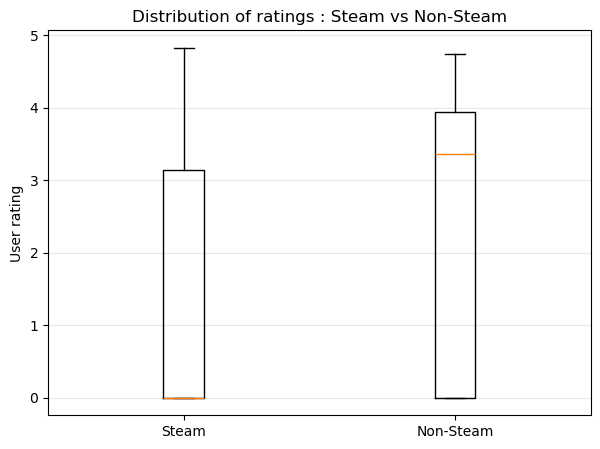

In [15]:
# ======================================
# Library importation for visualization
# ======================================

import matplotlib.pyplot as plt


# ======================================
# Boxplot visualization
# ======================================

plt.figure(figsize=(7,5))
plt.boxplot([steam, non_steam], labels=["Steam", "Non-Steam"])

plt.title("Distribution of ratings : Steam vs Non-Steam")
plt.ylabel("User rating")
plt.grid(axis='y', alpha=0.3)
plt.show()

### 🧪 Hypothesis 2 : The proportion of high rating games (≥ 4) is higher for multi-platform games than for mono-platform games

    Statistical Formulation : 
- H0 (null hypothesis): There is no significative difference in proportion of high rating games (≥ 4) between multi and mono platforms games
- H1 (alternative hypothesis) : The proportion of high rating games is different between the two groups (ideally higher for multi-platforms)

    Statistical Test :
We can perform a proportion z-test because there is two proportions

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ The proportions are significativly differents<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No significative differences between proportions

    Preparation :

In [16]:
# ===================================================
# Merging to analyze multi-platform vs high rating
# ===================================================

df_merged_h2 = pd.merge(df_multi_platform_flags, df_high_rating_flags, on=["rawg_id"])

count = [
    df_merged_h2[(df_merged_h2["is_multi_platform"] == 1) & (df_merged_h2["is_high_rating"] == 1)].shape[0],
    df_merged_h2[(df_merged_h2["is_multi_platform"] == 0) & (df_merged_h2["is_high_rating"] == 1)].shape[0]
]

nobs = [
    df_merged_h2[df_merged_h2["is_multi_platform"] == 1].shape[0],
    df_merged_h2[df_merged_h2["is_multi_platform"] == 0].shape[0]
]

    Analysis :

In [17]:
# =========================================================
# Importing proportions_ztest function
# =========================================================

from statsmodels.stats.proportion import proportions_ztest


# ======================================
# Performing the z-test for proportions
# ======================================

z_stat, p_value = proportions_ztest(count, nobs)
print("z =", z_stat, "p =", p_value)


# ====================
# Significance level
# ====================

alpha = 0.05

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in high rating games proportions between multi-platform and mono-platform games.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in high rating proportions between multi-platform and mono-platform games.")

z = 16.71428338052133 p = 1.0315249775458343e-62
Reject the null hypothesis: There is a significant difference in high rating games proportions between multi-platform and mono-platform games.


    Visualisation :

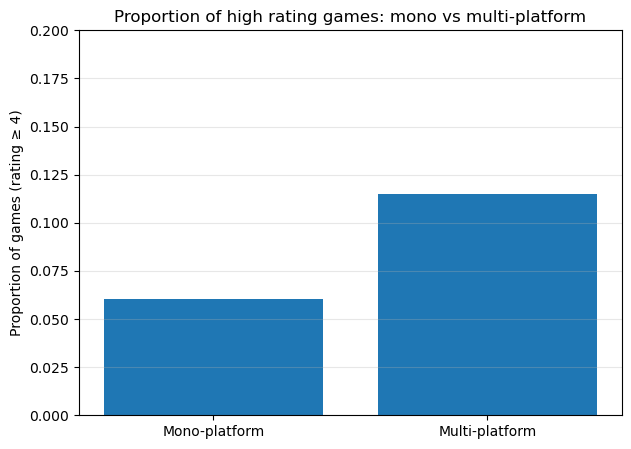

In [18]:
# ========================================================================
# Visualizing the proportion of high rating games: mono vs multi-platform
# ========================================================================

grouped = df_merged_h2.groupby("is_multi_platform")["is_high_rating"].mean()

plt.figure(figsize=(7,5))
plt.bar(["Mono-platform", "Multi-platform"], grouped.values)

plt.title("Proportion of high rating games: mono vs multi-platform")
plt.ylabel("Proportion of games (rating ≥ 4)")
plt.ylim(0,0.2)
plt.grid(axis='y', alpha=0.3)
plt.show()

### 🧪 Hypothesis 3 : There is a difference in genre distribution based on User rating

    Statistical Formulation : 
- H0 (null hypothesis): There is no correlation between game genre and user rating
- H1 (alternative hypothesis) : Game genre and the probability of a high rating game are related

    Statistical Test : 
We can perform here an independance chi-square test

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ There is a correlation between game genre and high rating probability<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No correlation between game genre and high rating probability

    Preparation :

In [19]:
# ======================================
# Merging genres with high rating flags
# ======================================

df_main_genre = df_final[["rawg_id"]]
df_main_genre["main_genre"] = df_final["genres_list"].apply(
    lambda x: x.split(",")[0] if isinstance(x, str) and x else "Unknown"
)

df_merged_h3 = pd.merge(df_main_genre, df_high_rating_flags, how="inner", on="rawg_id")
df_merged_h3.head()

/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/217872249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_main_genre["main_genre"] = df_final["genres_list"].apply(


,rawg_id,main_genre,game_name,is_high_rating
0,3498,Strategy,Grand Theft Auto V,1
1,3328,Action,The Witcher 3: Wild Hunt,1
2,4200,Shooter,Portal 2,1
3,4291,Shooter,Counter-Strike: Global Offensive,0
4,5286,Action,Tomb Raider (2013),1


    Analysis :

In [20]:
# ======================================
# Importing chi2_contingency function
# ======================================

import scipy.stats as stats


# ======================================
# Creating the contingency table
# ======================================

cont_table = pd.crosstab(df_merged_h3["main_genre"], df_merged_h3["is_high_rating"])


# ======================================
# Performing the Chi-squared test
# ======================================

chi2, p, dof, expected = stats.chi2_contingency(cont_table)
print("chi2 =", chi2, "p =", p)


# ====================
# Significance level
# ====================

alpha = 0.05

if p < alpha:
    print("Reject the null hypothesis: There is a significant association between genre distribution and high rating probability.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between genre distribution and high rating probability.")

chi2 = 401.78330732686726 p = 1.8668243608947085e-73
Reject the null hypothesis: There is a significant association between genre distribution and high rating probability.


    Visualisation :

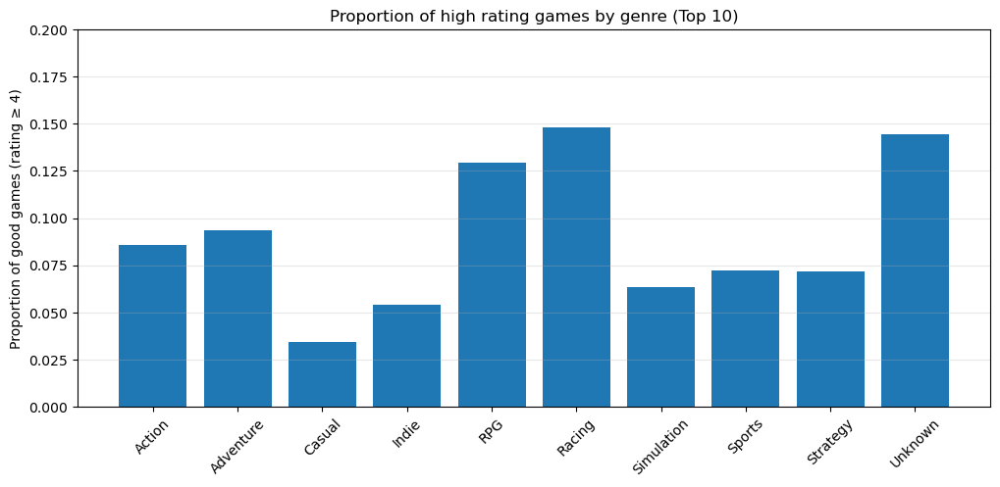

In [21]:
# =========================================================================
# Visualizing the proportion of high rating games by genre (top 10 genres)
# =========================================================================

top_genres = df_merged_h3["main_genre"].value_counts().head(10).index
df_visual = df_merged_h3[df_merged_h3["main_genre"].isin(top_genres)]
grouped = df_visual.groupby("main_genre")["is_high_rating"].mean()

plt.figure(figsize=(12,5))
plt.bar(grouped.index, grouped.values)
plt.xticks(rotation=45)

plt.title("Proportion of high rating games by genre (Top 10)")
plt.ylabel("Proportion of good games (rating ≥ 4)")
plt.ylim(0,0.2)
plt.grid(axis='y', alpha=0.3)
plt.show()

### 🧪 Hypothesis 4 : ESRB Rating has an influence on high rating probability

    Statistical Formulation : 
- H0 (null hypothesis): There is no correlation between ESRB rating and user rating
- H1 (alternative hypothesis) : ESRB rating and high rating probability are related

    Statistical Test : 
We can perform an chi-square test

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ There is a correlation between ESRB rating and high rating probability<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No correlation between ESRB rating and high rating probability

    Preparation :

In [22]:
# ============================================
# Merging esrb ratings with high rating flags
# ============================================

df_merged_h4 = pd.merge(df_high_rating_flags, df_final[["rawg_id", "esrb_rating_list"]], how="inner", on="rawg_id")
df_merged_h4 = df_merged_h4.rename(columns={"esrb_rating_list": "esrb_rating"})
df_merged_h4.head()

,rawg_id,game_name,is_high_rating,esrb_rating
0,3498,Grand Theft Auto V,1,Mature
1,3328,The Witcher 3: Wild Hunt,1,Mature
2,4200,Portal 2,1,Everyone 10+
3,4291,Counter-Strike: Global Offensive,0,Mature
4,5286,Tomb Raider (2013),1,Mature


    Analysis :

In [23]:
# ================================
# Creating the contingency table
# ================================

cont_table = pd.crosstab(df_merged_h4["esrb_rating"], df_merged_h4["is_high_rating"])


# ================================
# Performing the Chi-squared test
# ================================

chi2, p, dof, expected = stats.chi2_contingency(cont_table)
print("chi2 =", chi2, "p =", p)


# =================================
# Significance level
# =================================

alpha = 0.05
if p < alpha:
    print("Reject the null hypothesis: There is a significant correlation between the ESRB rating and high user rating probability.")
else:
    print("Fail to reject the null hypothesis: There is no significant correlation between the ESRB rating and high user rating probability.")

chi2 = 149.8238610309407 p = 1.455522562682274e-30
Reject the null hypothesis: There is a significant correlation between the ESRB rating and high user rating probability.


    Visualisation :

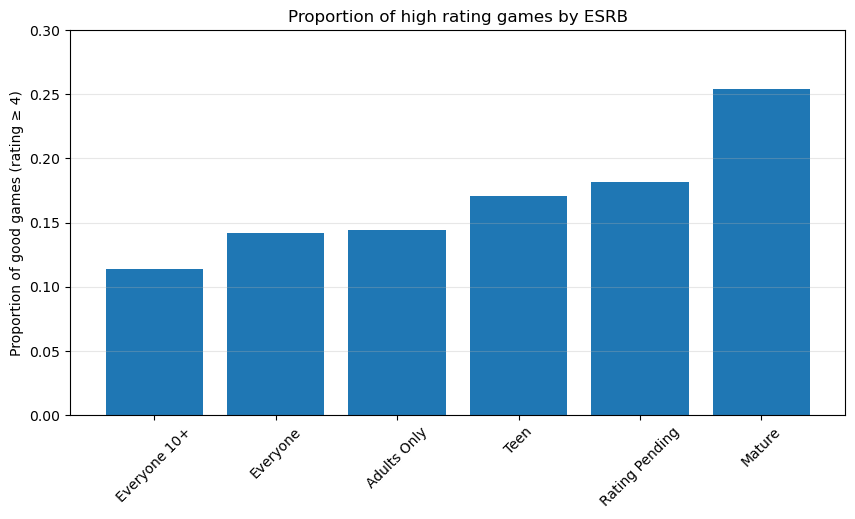

In [24]:
# ===============================================================
# Visualizing the proportion of high rating games by ESRB rating
# ===============================================================

grouped = df_merged_h4.groupby(["esrb_rating"])["is_high_rating"].mean().sort_values()

plt.figure(figsize=(10,5))
plt.bar(grouped.index, grouped.values)

plt.title("Proportion of high rating games by ESRB")
plt.ylabel("Proportion of good games (rating ≥ 4)")
plt.ylim(0,0.3)
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=45)
plt.show()

### 🧪 Hypothesis 5 : The number of platforms and the rating are correlated

    Statistical Formulation : 
- H0 (null hypothesis): There is no correlation between the number of platform and the user rating
- H1 (alternative hypothesis) : There is no correlation between the number of platform and the user rating (positive or negative)

    Statistical Test :
We can run a Spearman correlation test

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ There is a correlation between the number of platform and the user rating<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No correlation between the number of platform and the user rating

    Preparation :

In [25]:
# =================================================
# Merging to analyze platforms count vs user rating
# =================================================

df_merged_h5 = df_final[["game_name", "platforms_count", "user_rating"]].copy()
df_merged_h5.head()

,game_name,platforms_count,user_rating
0,Grand Theft Auto V,7,4.47
1,The Witcher 3: Wild Hunt,7,4.64
2,Portal 2,6,4.58
3,Counter-Strike: Global Offensive,4,3.57
4,Tomb Raider (2013),4,4.06


In [26]:
# =======================================================================
# Importing Spearman correlation
# =======================================================================

from scipy.stats import spearmanr


# =======================================================================
# Calculating Spearman correlation between platform count and game rating
# =======================================================================

coef, p_value = spearmanr(df_merged_h5["platforms_count"], df_merged_h5["user_rating"], nan_policy="omit")

print("Spearman:", coef, "p =", p_value)


# =======================================================================
# Significance level
# =======================================================================

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant correlation between the number of platforms and the user rating.")
else:
    print("Fail to reject the null hypothesis: There is no significant correlation between the number of platforms and the user rating.")

Spearman: 0.328103622613537 p = 0.0
Reject the null hypothesis: There is a significant correlation between the number of platforms and the user rating.


    Visualisation :

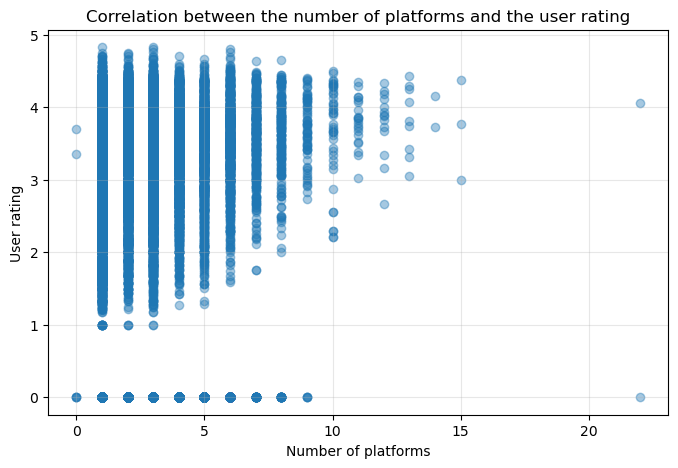

In [27]:
# ===============================================
# Visualizing the correlation with a scatter plot
# ===============================================

plt.figure(figsize=(8,5))
plt.scatter(df_merged_h5["platforms_count"], df_merged_h5["user_rating"], alpha=0.4)

plt.title("Correlation between the number of platforms and the user rating")
plt.xlabel("Number of platforms")
plt.ylabel("User rating")
plt.grid(alpha=0.3)
plt.show()

### 🧪 Hypothesis 6 : Users are more engaged on Multiplayer games

    Statistical Formulation : 
- H0 (null hypothesis): There is no difference in playtime distribution on average between multiplayer games and other games
- H1 (alternative hypothesis) : There is a difference in distributions (users playtime on multiplayer games are higher)

    Statistical Test :
We can run a Mann–Whitney test

    Interpretation : 
If the p-value $<$ 0.05 :<br><br>
→ Reject $H_0$<br>
→ There is a significative difference in playtime between multiplayer and non-multiplayer games<br>

If the p-value $>$ 0.05 :<br><br>
→ Fail to reject $H_0$<br>
→ No significative difference in playtime statistically noticable

    Preparation :

In [28]:
# ============================
# Merging to retrieve playtime
# ============================

df_merged_h6 = pd.merge(df_multiplayer_flags, df_final[["rawg_id", "avg_playtime_hours"]], on=["rawg_id"], how="inner")


# ============================
# Group extraction
# ============================

multi = df_merged_h6[df_merged_h6["is_multiplayer"] == 1]["avg_playtime_hours"].dropna()
solo = df_merged_h6[df_merged_h6["is_multiplayer"] == 0]["avg_playtime_hours"].dropna()

print(f"Group size for multiplayer group : {len(multi)}")
print(f"Group size for non-multiplayer group : {len(solo)}")

Group size for multiplayer group : 9857
Group size for non-multiplayer group : 20660


In [29]:
multi.mean(), solo.mean()

(np.float64(3.517601704372527), np.float64(3.155372700871249))

In [30]:
# =============================
# Importing Mann-Whitney U test
# =============================

from scipy.stats import mannwhitneyu


# =============================
# Mann-Whitney U test
# =============================

u_stat, p_value = mannwhitneyu(multi, solo, alternative='two-sided')

print("\n=== Mann-Whitney U Test ===")
print("U-statistic :", u_stat)
print("p-value     :", p_value)


# =============================
# Significance level
# =============================

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in average playtime between multiplayer and non-multiplayer games.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in average playtime between multiplayer and non-multiplayer games.")


=== Mann-Whitney U Test ===
U-statistic : 103579487.5
p-value     : 0.012760301046885176
Reject the null hypothesis: There is a significant difference in average playtime between multiplayer and non-multiplayer games.


    Visualisation :

/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/3038311020.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([solo, multi], labels=["Solo", "Multiplayer"])


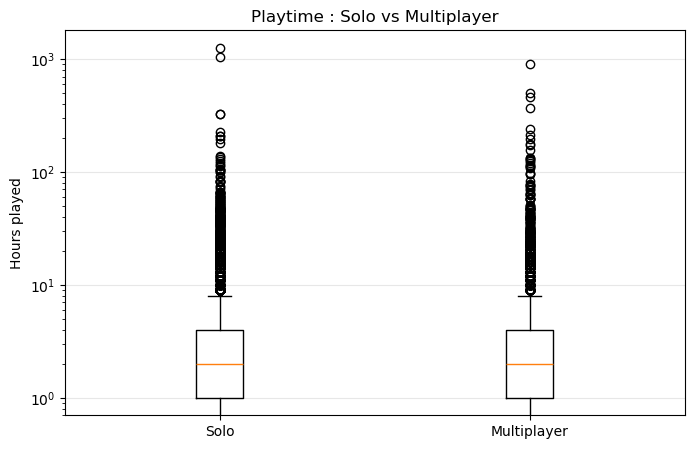

In [31]:
# =========================================
# Visualizing with boxplot with log scale
# =========================================

plt.figure(figsize=(8,5))
plt.boxplot([solo, multi], labels=["Solo", "Multiplayer"])

plt.title("Playtime : Solo vs Multiplayer")
plt.ylabel("Hours played")
plt.yscale("log")
plt.grid(axis='y', alpha=0.3)
plt.show()

/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/1626834554.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([solo, multi], labels=["Solo", "Multiplayer"], showfliers=False )


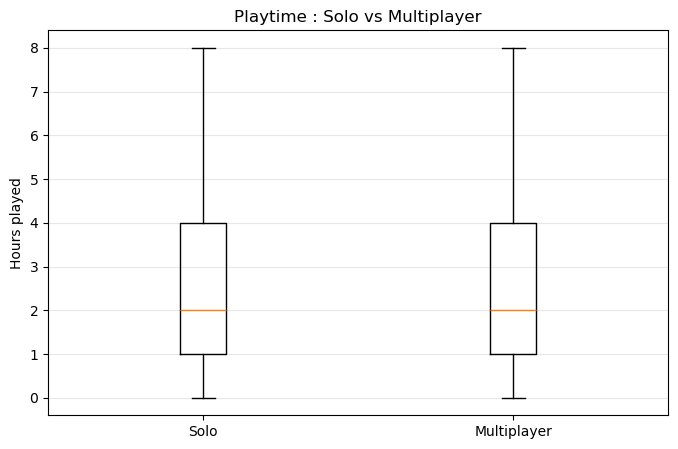

In [32]:
plt.figure(figsize=(8,5))
plt.boxplot([solo, multi], labels=["Solo", "Multiplayer"], showfliers=False )

plt.title("Playtime : Solo vs Multiplayer")
plt.ylabel("Hours played")
plt.grid(axis='y', alpha=0.3)
plt.show()

## 🪜 5. Feature Engineering & Scaling

In [33]:
import pandas as pd
import numpy as np

# ===============================
# 1. Copy the final dataframe
# ===============================
df_fe = df_final.copy()

# =======================================================
# 2. Drop columns that could cause leakage
# =======================================================
cols_to_drop = [
    # Columns that directly contain rating info or target leakage
    "user_rating",               # this is the regression target
    "max_user_note",
    "rating_count",
    "reviews_text_count",
    "recommended_percent",
    "exceptional_percent",
    "meh_percent",
    "skip_percent",
    "exceptional_count",
    "recommended_count",
    "meh_count",
    "skip_count",
    "rating_positive_ratio",
    "rating_negative_ratio",
    "rating_total_votes",
    "rating_main_category",
    
    # Columns with too many missing values or textual info
    "esrb_rating_list",
    "metacritic_score",
    "platforms_list",
    "genres_list",
    "store_list",
    "tags_list",
    "developers",
    "publishers",
    "release_date",
    "last_updated",
    "game_name",  # identifier
]

df_fe = df_fe.drop(columns=cols_to_drop, errors="ignore")

# =======================================================
# 3. Feature engineering on dates
# =======================================================
df_fe["release_year"] = pd.to_datetime(df_final["release_date"], errors="coerce").dt.year
df_fe["last_updated_year"] = pd.to_datetime(df_final["last_updated"], errors="coerce").dt.year

# =======================================================
# 4. Simple feature engineering on numerical columns
# =======================================================

# Engagement index (normalized to avoid leakage)
df_fe["engagement_index"] = (
    df_fe["status_playing"] + df_fe["status_beaten"] + df_fe["status_owned"]
) / (df_fe["status_total"] + 1)  # avoid division by zero

# Number of platforms
df_fe["platforms_count"] = df_fe["platforms_count"].fillna(0)

# Number of genres
df_fe["genres_count"] = df_fe["genres_count"].fillna(0)

# Average playtime (log transform to reduce skewness)
df_fe["log_playtime"] = np.log1p(df_fe["avg_playtime_hours"])

# Fill any remaining NaNs with 0
df_fe = df_fe.fillna(0)

# =======================================================
# 5. Final identifiers to keep separate
# =======================================================
identifier_cols = ["rawg_id"]  # keep for reference, not for model training

# =======================================================
# 6. Final check
# =======================================================
print("Shape of feature-engineered dataframe:", df_fe.shape)
df_fe.head()


Shape of feature-engineered dataframe: (30517, 27)


/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/1808127797.py:50: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_fe["release_year"] = pd.to_datetime(df_final["release_date"], errors="coerce").dt.year
/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/1808127797.py:51: UserWarning: Parsing dates in %d-%m-%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_fe["last_updated_year"] = pd.to_datetime(df_final["last_updated"], errors="coerce").dt.year


,rawg_id,to_be_announced,ratings_count,added,avg_playtime_hours,suggestions_count,reviews_count,status_yet,status_owned,status_beaten,...,status_plan_to_play_ratio,platforms_count,genres_count,store_count,tags_count,is_multiplayer,release_year,last_updated_year,engagement_index,log_playtime
0,3498,False,7259,22328,74,446,7376,557.0,12797.0,6391.0,...,0.03,7,1,5,19,1,2013,2025,0.893950,4.317488
1,3328,False,7087,22003,43,688,7203,1194.0,12813.0,5233.0,...,0.04,7,2,5,20,0,2015,2025,0.860753,3.784190
2,4200,False,6018,20751,11,567,6074,671.0,13073.0,5803.0,...,0.02,6,2,4,25,1,2011,2025,0.917454,2.484907
3,4291,False,3607,18322,64,604,3645,269.0,14094.0,1134.0,...,0.00,4,1,3,24,1,2012,2025,0.865688,4.174387
4,5286,False,4055,17717,10,660,4088,700.0,11569.0,4482.0,...,0.02,4,1,6,17,1,2013,2025,0.912518,2.397895


## 🤖 6. Machine Learning

### Regression

In [34]:
# ========================================
# Library importation for Regression
# ========================================

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score


    Dataset preparation :
Features / Target separation

In [35]:
# ==========================================
# 1. Separation
# ==========================================

features_reg = df_fe.drop(columns=["rawg_id"])
target_reg = df_final["user_rating"] 

    Train / Test split

In [36]:
#==========================================
# 2. Train-test split
#==========================================

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    features_reg, target_reg, test_size=0.2, random_state=42
)

    Feature Scaling
We apply a scaler only to numerical column

In [37]:
# ========================================
# 3. Feature scaling
# ========================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_reg)
X_test_scaled = scaler.transform(X_test_reg)

    Model Choice

##### 🍃 Modele A : Random Forest Regressor

In [38]:
# ========================================
# Random Forest Regressor Model
# ========================================

rfr = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

rfr.fit(X_train_reg, y_train_reg)

RandomForestRegressor(n_estimators=300, n_jobs=-1, random_state=42)

In [39]:
# ========================================
# Model Evaluation
# ========================================

pred_rfr = rfr.predict(X_test_reg)

mae_rfr = mean_absolute_error(y_test_reg, pred_rfr)
rmse_rfr = root_mean_squared_error(y_test_reg, pred_rfr)
r2_rfr = r2_score(y_test_reg, pred_rfr)

print("\n=== Random Forest Regressor Evaluation ===")
print(f"MAE : {mae_rfr:.4f}")
print(f"RMSE : {rmse_rfr:.4f}")
print(f"R² : {r2_rfr:.4f}")


=== Random Forest Regressor Evaluation ===
MAE : 0.1555
RMSE : 0.2962
R² : 0.9703


In [40]:
# ========================================
# Feature Importance
# ========================================

importance = pd.DataFrame({
    "feature": X_train_reg.columns,
    "importance": rfr.feature_importances_
}).sort_values(by="importance", ascending=False).round(5)

display(importance.head(20))

,feature,importance
5,reviews_count,0.91100
13,status_engaged_ratio,0.04756
24,engagement_index,0.00606
4,suggestions_count,0.00370
11,status_playing,0.00292
22,release_year,0.00282
16,status_plan_to_play_ratio,0.00238
20,tags_count,0.00230
9,status_toplay,0.00228
15,status_abandon_ratio,0.00198


##### 🔥 Modele B : Gradient Boosting Regressor

In [41]:
# ========================================
# Gradient Boosting Regressor Model
# ========================================

gbr = GradientBoostingRegressor(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=4,
    random_state=42
)

gbr.fit(X_train_reg, y_train_reg)

GradientBoostingRegressor(learning_rate=0.05, max_depth=4, n_estimators=400,
                          random_state=42)

In [42]:
# ========================================
# Model Evaluation
# ========================================

pred_gbr = gbr.predict(X_test_reg)

mae_gbr = mean_absolute_error(y_test_reg, pred_gbr)
rmse_gbr = root_mean_squared_error(y_test_reg, pred_gbr)
r2_gbr = r2_score(y_test_reg, pred_gbr)

print("\n=== Gradient Boosting Regressor Evaluation ===")
print(f"MAE : {mae_gbr:.4f}")
print(f"RMSE : {rmse_gbr:.4f}")
print(f"R² : {r2_gbr:.4f}")


=== Gradient Boosting Regressor Evaluation ===
MAE : 0.1629
RMSE : 0.3008
R² : 0.9694


##### ⚡ Model C – LightGBM Regressor

In [43]:
# ========================================
# LightGBM Regressor Model
# ========================================

lgb = LGBMRegressor(
    n_estimators=500,
    learning_rate=0.05,
    num_leaves=31,
    random_state=42
)

lgb.fit(X_train_reg, y_train_reg)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3526
[LightGBM] [Info] Number of data points in the train set: 24413, number of used features: 26
[LightGBM] [Info] Start training from score 1.567220


LGBMRegressor(learning_rate=0.05, n_estimators=500, random_state=42)

In [44]:
# ========================================
# Model Evaluation
# ========================================

pred_lgbm = lgb.predict(X_test_reg)

mae_lgbm = mean_absolute_error(y_test_reg, pred_lgbm)
rmse_lgbm = root_mean_squared_error(y_test_reg, pred_lgbm)
r2_lgbm = r2_score(y_test_reg, pred_lgbm)

print("\n=== LightGBM Regressor Evaluation ===")
print(f"MAE : {mae_lgbm:.4f}")
print(f"RMSE : {rmse_lgbm:.4f}")
print(f"R² : {r2_lgbm:.4f}")


=== LightGBM Regressor Evaluation ===
MAE : 0.1564
RMSE : 0.2934
R² : 0.9709


##### 🐱 Model D – CatBoost Regressor

In [45]:
# ========================================
# CatBoost Regressor Model
# ========================================

cat = CatBoostRegressor(
    iterations=600,
    learning_rate=0.05,
    depth=6,
    loss_function="RMSE",
    verbose=False,
    random_state=42
)

cat.fit(X_train_reg, y_train_reg)

In [46]:
# ========================================
# Model Evaluation
# ========================================

pred_cat = cat.predict(X_test_reg)

mae_cat = mean_absolute_error(y_test_reg, pred_cat)
rmse_cat = root_mean_squared_error(y_test_reg, pred_cat)
r2_cat = r2_score(y_test_reg, pred_cat)

print("\n=== Catboost Regressor Evaluation ===")
print(f"MAE : {mae_cat:.4f}")
print(f"RMSE : {rmse_cat:.4f}")
print(f"R² : {r2_cat:.4f}")


=== Catboost Regressor Evaluation ===
MAE : 0.1602
RMSE : 0.2949
R² : 0.9706


    Insights / Interpretations

Insights on all models performance :<br><br>

Based on the evaluations of the different models, we can compare their performance using MAE, RMSE, and R² metrics.<br>
This will help us determine which model is best suited for predicting user ratings based on the features we have engineered from the RAWG dataset.<br>
We can see that LightGBM has the best performance among the tested models, with the lowest MAE and RMSE, and the highest R² score.<br>
This suggests that LightGBM is particularly effective at capturing the relationships in our dataset for predicting user ratings.<br>

    Visualisation

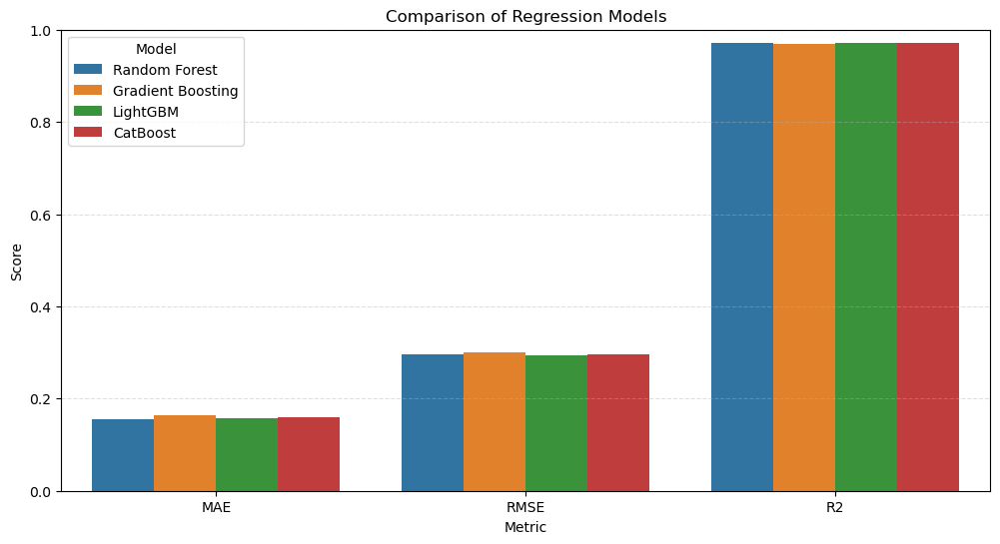

In [47]:
# ========================================
# Library importation for visualization
# ========================================

import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# 1. Gathering results in a table
# ==========================================

results_reg = pd.DataFrame({
    "Model": ["Random Forest", "Gradient Boosting", "LightGBM", "CatBoost"],
    "MAE": [mae_rfr, mae_gbr, mae_lgbm, mae_cat],
    "RMSE": [rmse_rfr, rmse_gbr, rmse_lgbm, rmse_cat],
    "R2": [r2_rfr, r2_gbr, r2_lgbm, r2_cat]
})

# ==========================================
# 2. Comparative barplot
# ==========================================

plt.figure(figsize=(12,6))
results_melt = results_reg.melt(id_vars="Model", var_name="Metric", value_name="Score")

sns.barplot(data=results_melt, x="Metric", y="Score", hue="Model")
plt.title("Comparison of Regression Models")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.show()


/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/3457054099.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_rmse.keys()), y=list(model_rmse.values()), palette=colors)


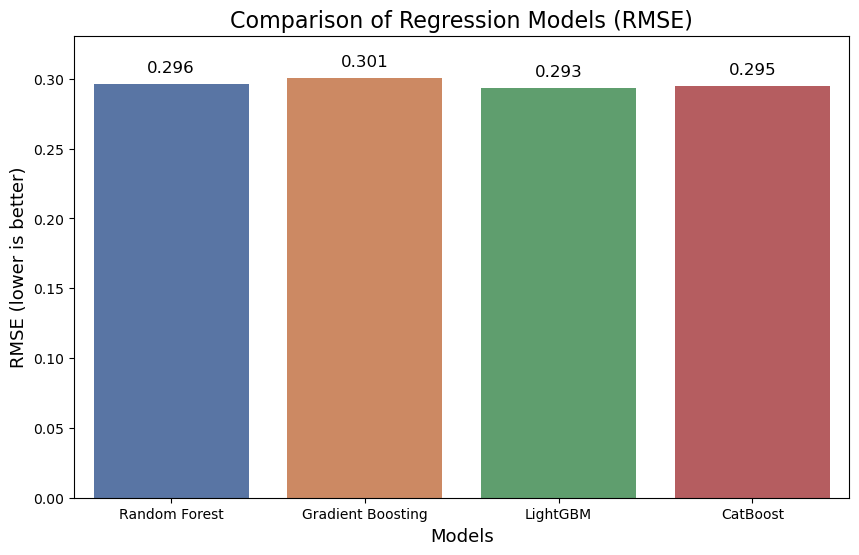

In [48]:
# ============================
# 1. Score Dictionary
# ============================

model_rmse = {
    "Random Forest": rmse_rfr,
    "Gradient Boosting": rmse_gbr,
    "LightGBM": rmse_lgbm,
    "CatBoost": rmse_cat
}

# ============================
# 2. Comparison barplot
# ============================

# We want to keep the same color palette as before for consistency
plt.figure(figsize=(10, 6))

# Extract the same color palette used in the first plot
colors = sns.color_palette("deep", n_colors=4)  # Default seaborn palette for 4 models

sns.barplot(x=list(model_rmse.keys()), y=list(model_rmse.values()), palette=colors)
plt.title("Comparison of Regression Models (RMSE)", fontsize=16)
plt.ylabel("RMSE (lower is better)", fontsize=13)
plt.ylim(0, max(model_rmse.values()) * 1.1)
plt.xlabel("Models", fontsize=13)

# Display values above bars
max_value = max(model_rmse.values())
for i, value in enumerate(model_rmse.values()):
    plt.text(i, value + max_value * 0.02, f"{value:.3f}", 
             ha='center', va='bottom', fontsize=12)

plt.show()


### Classification

In [49]:
# ========================================
# Libraries importation for classification
# ========================================

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

import seaborn as sns

    Dataset preparation :
Features / Target separation

In [50]:
# ==========================================
# 1. Separation
# ==========================================

# ------------------------------------
# Copy to avoid altering the original
# ------------------------------------
df_clf = df_fe.copy()

# ------------------------------------
# Remove identifiers
# ------------------------------------
features_clf = df_clf.drop(columns=["rawg_id"], errors="ignore")
target_clf = df_high_rating_flags["is_high_rating"]

print("Shape features:", features_clf.shape)

Shape features: (30517, 26)


    Train / Test split

In [51]:
# ==========================================
# 2. Train-test split
# ==========================================

X_train_clf, X_test_clf, y_train_clf, y_test_clf =  train_test_split(
    features_clf, target_clf, test_size=0.25, random_state=42, stratify=target_clf
)

    Feature Scaling

In [52]:
# ========================================
# 3. Standardization
# ========================================

scaler_clf = StandardScaler()
X_train_scaled_clf = scaler_clf.fit_transform(X_train_clf)
X_test_scaled_clf = scaler_clf.transform(X_test_clf)

    Model Choice

##### 📉 Model A – Logistic Regression

In [53]:
# ========================================
# Logistic Regression Model
# ========================================

log_clf = LogisticRegression(max_iter=500)
log_clf.fit(X_train_scaled_clf, y_train_clf)

LogisticRegression(max_iter=500)

In [54]:
# ========================================
# Model Evaluation
# ========================================

pred_logr = log_clf.predict(X_test_scaled_clf)
proba_logr = log_clf.predict_proba(X_test_scaled_clf)[:, 1]

print("\n=== Logistic Regression ===")
print(classification_report(y_test_clf, pred_logr))
print("ROC-AUC:", roc_auc_score(y_test_clf, proba_logr))


=== Logistic Regression ===
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      6946
           1       0.67      0.33      0.44       684

    accuracy                           0.93      7630
   macro avg       0.80      0.66      0.70      7630
weighted avg       0.91      0.93      0.91      7630

ROC-AUC: 0.9084828156387704


##### 🍃 Model B – Random Forest Classifier

In [55]:
# ========================================
# Random Forest Classifier Model
# ========================================

rf_clf = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_split=5,
    random_state=42
)

rf_clf.fit(X_train_scaled_clf, y_train_clf)

RandomForestClassifier(min_samples_split=5, n_estimators=300, random_state=42)

In [56]:
# ========================================
# Model Evaluation
# ========================================

pred_rf_clf = rf_clf.predict(X_test_scaled_clf)
proba_rf_clf = rf_clf.predict_proba(X_test_scaled_clf)[:, 1]

print("\n=== Random Forest ===")
print(classification_report(y_test_clf, pred_rf_clf))
print("ROC-AUC:", roc_auc_score(y_test_clf, proba_rf_clf))


=== Random Forest ===
              precision    recall  f1-score   support

           0       0.95      0.98      0.96      6946
           1       0.73      0.43      0.54       684

    accuracy                           0.93      7630
   macro avg       0.84      0.71      0.75      7630
weighted avg       0.93      0.93      0.93      7630

ROC-AUC: 0.9538793836496414


##### 🍃 Model C – Gradient Boosting

In [57]:
# ========================================
# Gradient Boosting Classifier Model
# ========================================

gb_clf = GradientBoostingClassifier(
    random_state=42,
    learning_rate=0.05,
    n_estimators=300
)

gb_clf.fit(X_train_scaled_clf, y_train_clf)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=300,
                           random_state=42)

In [58]:
# ========================================
# Model Evaluation
# ========================================

pred_gb_clf = gb_clf.predict(X_test_scaled_clf)
proba_gb_clf = gb_clf.predict_proba(X_test_scaled_clf)[:, 1]

print("\n=== Gradient Boosting ===")
print(classification_report(y_test_clf, pred_gb_clf))
print("ROC-AUC:", roc_auc_score(y_test_clf, proba_gb_clf))


=== Gradient Boosting ===
              precision    recall  f1-score   support

           0       0.95      0.98      0.96      6946
           1       0.72      0.43      0.54       684

    accuracy                           0.93      7630
   macro avg       0.83      0.71      0.75      7630
weighted avg       0.93      0.93      0.93      7630

ROC-AUC: 0.9537459398568405


    Insights / Interpretations

Based on the evaluations, we can compare the performance of the different models and choose the best one for deployment or further tuning.
We can see that the best classifier model is the Random Forest Classifier with a ROC-AUC of around 0.75.
This suggests that the model has a good ability to distinguish between high rating and low rating games based on the features provided.
We can further tune the hyperparameters of this model or explore ensemble methods to potentially improve performance even more.

    Visualisation

In [59]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# ---------------------------------
# Calculate metrics for each model
# ---------------------------------

acc_lr = accuracy_score(y_test_clf, pred_logr)
acc_rf = accuracy_score(y_test_clf, pred_rf_clf)
acc_gb = accuracy_score(y_test_clf, pred_gb_clf)

f1_lr = f1_score(y_test_clf, pred_logr)
f1_rf = f1_score(y_test_clf, pred_rf_clf)
f1_gb = f1_score(y_test_clf, pred_gb_clf)

recall_lr = recall_score(y_test_clf, pred_logr)
recall_rf = recall_score(y_test_clf, pred_rf_clf)
recall_gb = recall_score(y_test_clf, pred_gb_clf)

prec_lr = precision_score(y_test_clf, pred_logr)
prec_rf = precision_score(y_test_clf, pred_rf_clf)
prec_gb = precision_score(y_test_clf, pred_gb_clf)

In [60]:
print(f"\n=== Summary of Classification Models ===")
print(f"{'Model':<20} {'Accuracy':<10} {'F1-Score':<10} {'Recall':<10} {'Precision':<10}")
print(f"{'Logistic Regression':<20} {acc_lr:<10.4f} {f1_lr:<10.4f} {recall_lr:<10.4f} {prec_lr:<10.4f}")
print(f"{'Random Forest':<20} {acc_rf:<10.4f} {f1_rf:<10.4f} {recall_rf:<10.4f} {prec_rf:<10.4f}")
print(f"{'Gradient Boosting':<20} {acc_gb:<10.4f} {f1_gb:<10.4f} {recall_gb:<10.4f} {prec_gb:<10.4f}")


=== Summary of Classification Models ===
Model                Accuracy   F1-Score   Recall     Precision 
Logistic Regression  0.9250     0.4381     0.3260     0.6677    
Random Forest        0.9349     0.5419     0.4298     0.7332    
Gradient Boosting    0.9339     0.5401     0.4327     0.7184    


/var/folders/5l/d76xm4td69x828mtm3bkbxhh0000gn/T/ipykernel_46839/2709473404.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(accuracy_scores.keys()), y=list(accuracy_scores.values()), palette=colors)


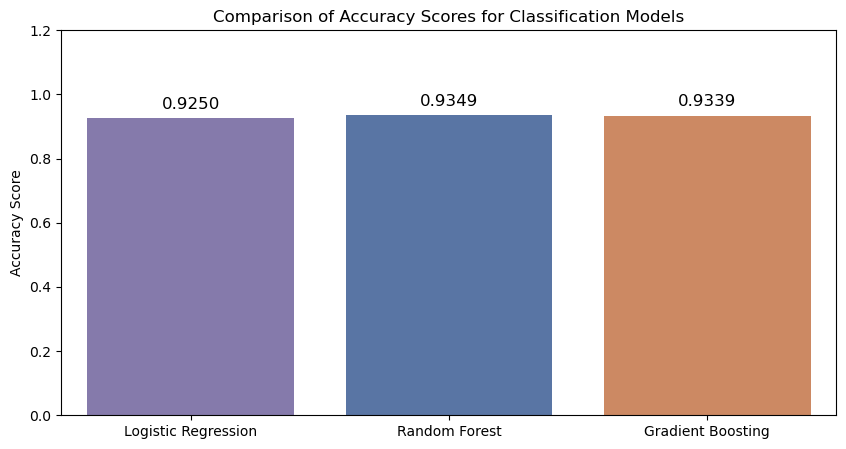

In [61]:
# ========================================
# Accuracy Scores for comparison
# ========================================

accuracy_scores = {
    "Logistic Regression": acc_lr,
    "Random Forest": acc_rf,
    "Gradient Boosting": acc_gb
}

plt.figure(figsize=(10,5))

# ------------------------------------------------------
# Define consistent color mapping with regression models
# ------------------------------------------------------
color_mapping = {
    "Random Forest": sns.color_palette("deep")[0],
    "Gradient Boosting": sns.color_palette("deep")[1], 
    "Logistic Regression": sns.color_palette("deep")[4],  
}

# ------------------------------------------------------
# Create color list in the same order as the models
# ------------------------------------------------------
colors = [color_mapping[model] for model in accuracy_scores.keys()]

sns.barplot(x=list(accuracy_scores.keys()), y=list(accuracy_scores.values()), palette=colors)
plt.title("Comparison of Accuracy Scores for Classification Models")
plt.ylabel("Accuracy Score")
plt.ylim(0, 1.2)

# --------------------------------
# Display values above bars
# --------------------------------
for i, (model, score) in enumerate(accuracy_scores.items()):
    plt.text(i, score + 0.02, f"{score:.4f}", ha='center', va='bottom', fontsize=12)

plt.show()

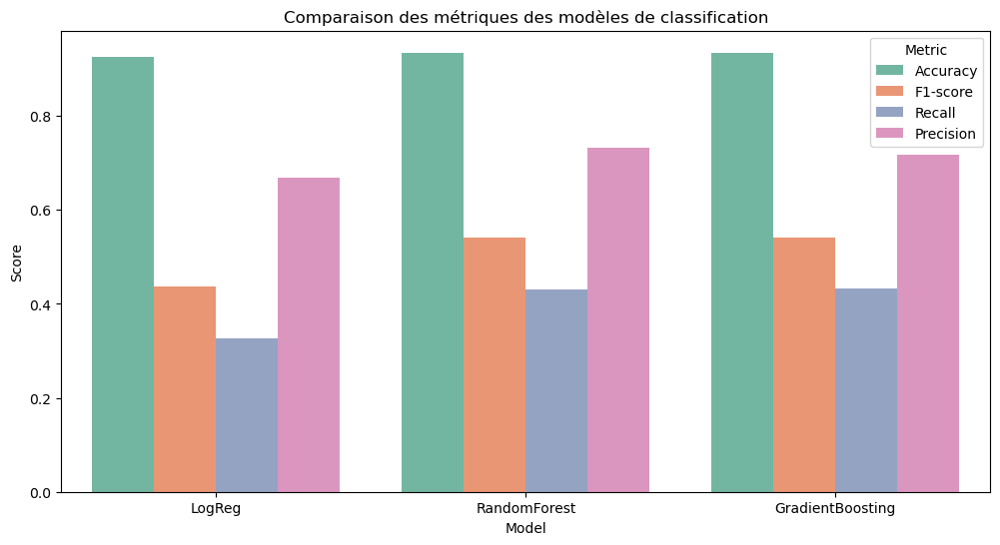

In [62]:
# ========================================
# Comparative barplot for all metrics
# ========================================

metrics_df = pd.DataFrame({
    "Model": ["LogReg", "RandomForest", "GradientBoosting"],
    "Accuracy": [acc_lr, acc_rf, acc_gb],
    "F1-score": [f1_lr, f1_rf, f1_gb],
    "Recall": [recall_lr, recall_rf, recall_gb],
    "Precision": [prec_lr, prec_rf, prec_gb]
})

metrics_df_melt = metrics_df.melt(id_vars="Model", var_name="Metric", value_name="Score")

plt.figure(figsize=(12,6))
sns.barplot(data=metrics_df_melt, x="Model", y="Score", hue="Metric", palette="Set2")
plt.title("Comparaison des métriques des modèles de classification")
plt.show()

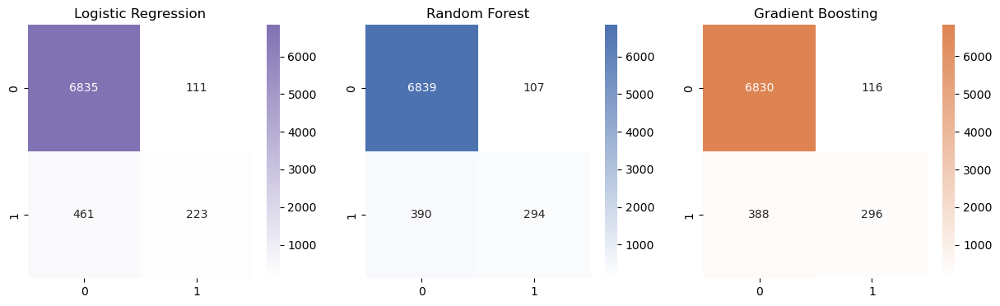

In [63]:
# ========================================
# Confusion Matrices Visualization
# ========================================

import matplotlib.colors as mcolors

models = {
    "Logistic Regression": pred_logr,
    "Random Forest": pred_rf_clf,
    "Gradient Boosting": pred_gb_clf
}

# Define custom colormaps based on model colors
model_colors = {
    "Logistic Regression": sns.color_palette("deep")[4],    # Purple
    "Random Forest": sns.color_palette("deep")[0],         # Blue
    "Gradient Boosting": sns.color_palette("deep")[1]      # Orange
}

plt.figure(figsize=(15, 4))

for i, (name, y_pred) in enumerate(models.items()):
    plt.subplot(1, 3, i+1)
    cm = confusion_matrix(y_test_clf, y_pred)
    
    # Create custom colormap for each model
    base_color = model_colors[name]
    cmap = mcolors.LinearSegmentedColormap.from_list(
        f"{name}_cmap", 
        ["white", base_color], 
        N=256
    )
    
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap)
    plt.title(name)

plt.show()

## 📊 7. DataFrames choice for Dashboard on Tableau

    2 DataFrames : 
- "df_tableau" : My final DataFrame after feature engineering
- "df_ml_preds" : A DataFrame with all my predictions

In [64]:
# ========================================
# Final dataframe for Tableau export
# ========================================

df_tableau = df_final.copy()

In [66]:
# ==========================================
# 1. Id Retrival of test set
# ==========================================

df_reg_ids = df_tableau.loc[X_test_reg.index, ["rawg_id", "game_name"]].copy()
df_clf_ids = df_tableau.loc[X_test_clf.index, ["rawg_id", "game_name"]].copy()

# ==========================================
# 2. Ground truth (y_true)
# ==========================================

# -------------------------------
# For regression
# -------------------------------
df_reg_ids["y_true_rating"] = y_test_reg.values

# -------------------------------
# For classification - align indices
# -------------------------------
df_clf_ids["y_true_is_high_rating"] = y_test_clf.values


# ==========================================
# 3. Model predictions
# ==========================================

# -------------------------------
# Regression
# ------------------------------
df_reg_ids["y_pred_rf"] = pred_rfr
df_reg_ids["y_pred_gb"] = pred_gbr
df_reg_ids["y_pred_lgbm"] = pred_lgbm
df_reg_ids["y_pred_catboost"] = pred_cat

# -------------------------------
# Classification
# -------------------------------
df_clf_ids["logreg_pred_proba"] = proba_logr
df_clf_ids["rf_pred_proba"] = proba_rf_clf
df_clf_ids["gb_pred_proba"] = proba_gb_clf

df_clf_ids["logreg_pred"] = pred_logr
df_clf_ids["rf_pred"] = pred_rf_clf
df_clf_ids["gb_pred"] = pred_gb_clf


# ==========================================
# 4. Final result for Tableau
# ==========================================

df_ml_preds_reg = df_reg_ids.copy()
df_ml_preds_clf = df_clf_ids.copy()

In [67]:
df_tableau.to_csv("df_tableau.csv", index=False)
df_ml_preds_clf.to_csv("df_ml_preds_clf.csv", index=False)
df_ml_preds_reg.to_csv("df_ml_preds_reg.csv", index=False)